# AMBER Potential Energy (EPtot) versus CCS

In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.ticker import FormatStrFormatter
from matplotlib.ticker import NullFormatter
from scipy.stats import gaussian_kde
from scipy.stats.stats import pearsonr
from scipy.stats import linregress

In [2]:
# hartree = 627.509 kcal/mol
names = ['Harmine', '1-Methylguanosine', 'Sphingosine', 'riboflavin', 'Mandelonitrile',
         'Creatinine', 'Methyleugenol', 'N6-methyladenosine', 'Cholic Acid', 'Astilbin',
         'SDGRG', 'Biliverdin', 'Anthranilic acid', 'Aminohippuric acid',
        '3\'-O-methylguanosine', 'Sucrose', 'Naringin', 'PE 16:1/16:1']
molids = ['02', '03', '04', '05', '10', '11', '12', '14', '16', '17', '18', '19', '21', 
          '22', '24', '25', '28', '29']
adducts = ['+H','+H','+H','+H','+H',
           '+Na','+Na','+Na','+Na','+Na','+Na','+Na', 
           '-H', '-H', '-H', '-H', '-H', '-H']
hexs = ['#f90000', '#f95200', '#f98800', '#f9ae00', '#f9db00', '#ecf900', '#9df900', '#00f94a', 
        '#00f9c7', '#00f4f9', '#00b6f9', '#007cf9', '#0014f9', '#ae00f9', '#f900f9', '#f90091', 
        '#a5a5a5', '#e3e3e3']
mass = [212.094963, 297.1073186, 299.2824294, 376.1382844, 133.0527639, 113.0589119,
        178.0993797, 281.112404, 408.2875744, 450.1162115, 490.2135746, 582.2478348,
        137.0476785, 194.0691422, 297.1073186, 342.1162115, 580.1792057, 687.4839047]

## amber energy (EPtot) vs ccs, one plot

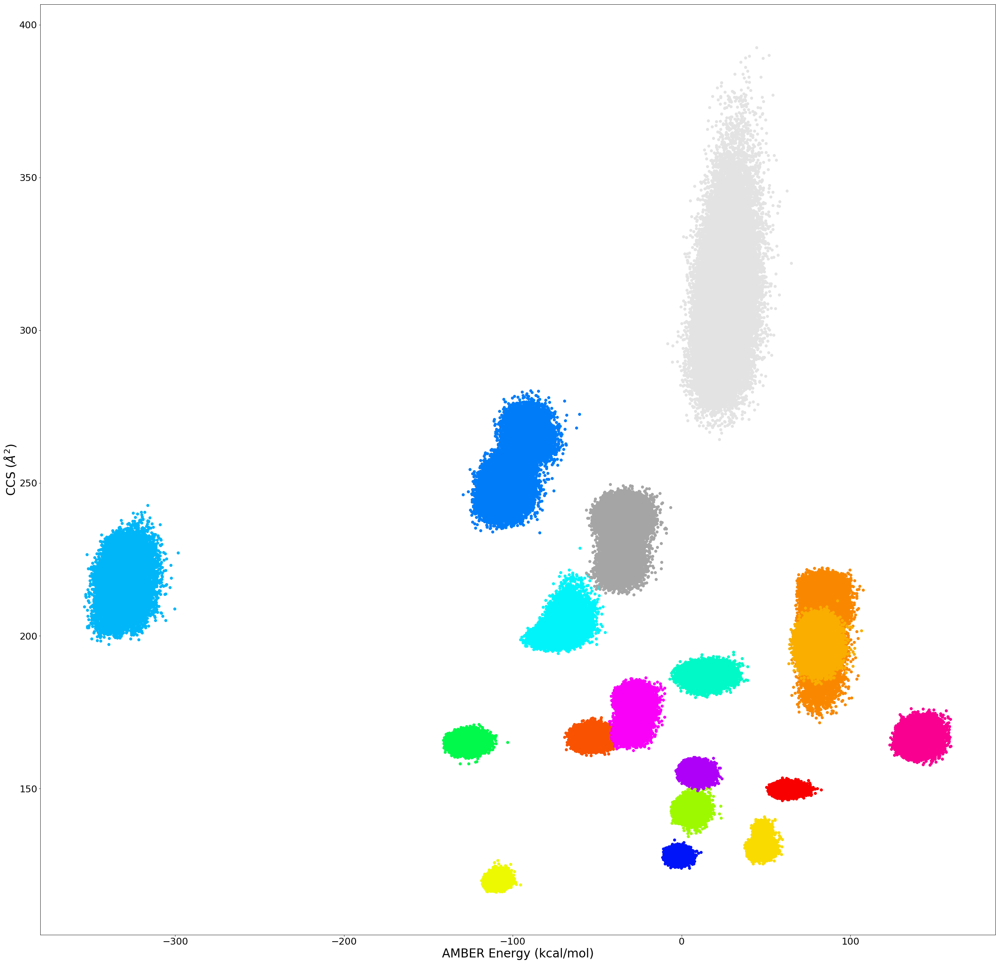

In [4]:
plt.figure(1, figsize=(40, 40))
for i, ID in enumerate(molids):
    file = f'../data/molid{ID}{adducts[i]}_amber_dft_ccs.csv'
    
    if os.path.exists(file):
        pass
    else:
        print(f'not found for {ID}')
        continue    

    df = pd.read_csv(file)

    x = df['EPtot']
    y = df['ccs']
    plt.scatter(x, y, c=f'{hexs[i]}') #, c=z)

plt.ylabel('CCS ($\AA^2$)', fontsize=28)
plt.xlabel('AMBER Energy (kcal/mol)', fontsize=28)
plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

## Comparing Amber (EPtot) low energies to DFT low energies on flat color "clouds"

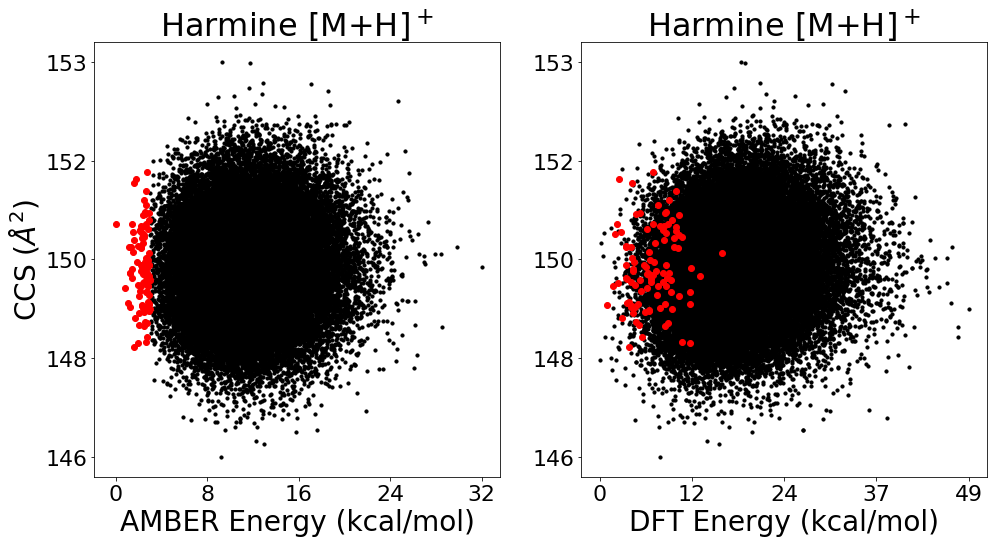

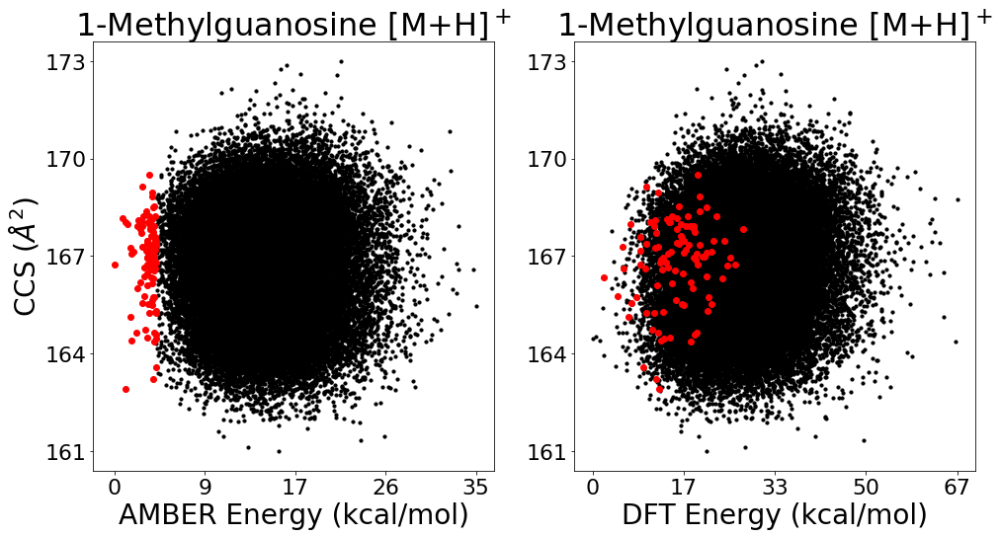

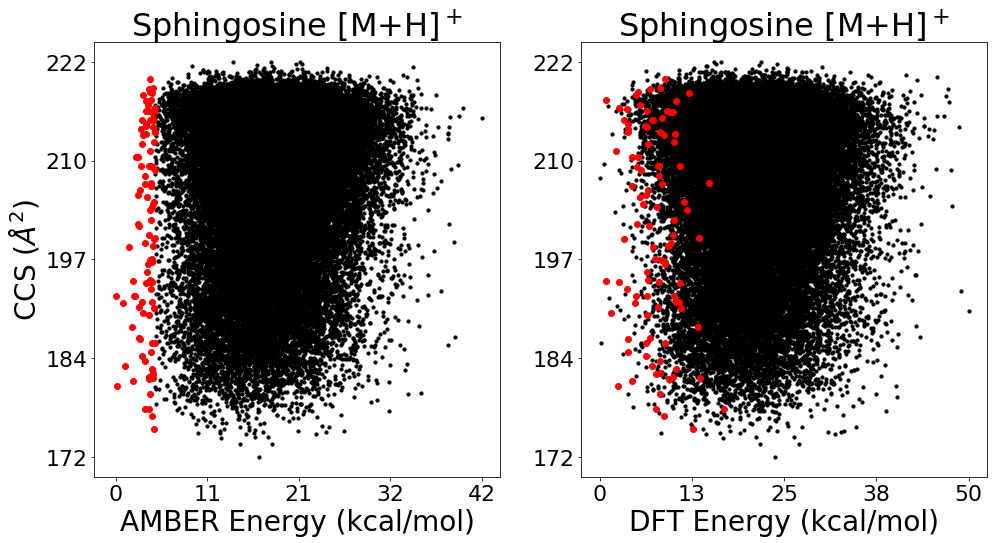

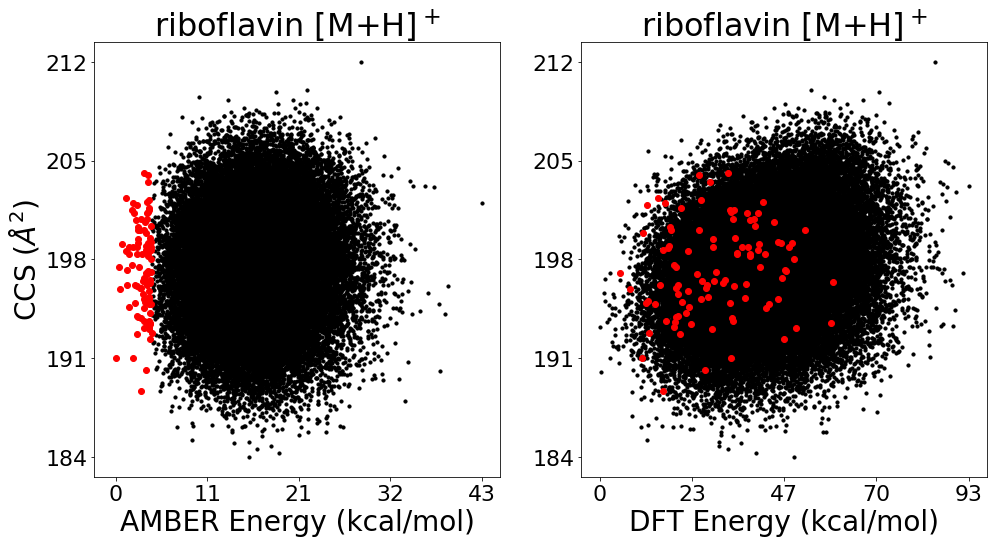

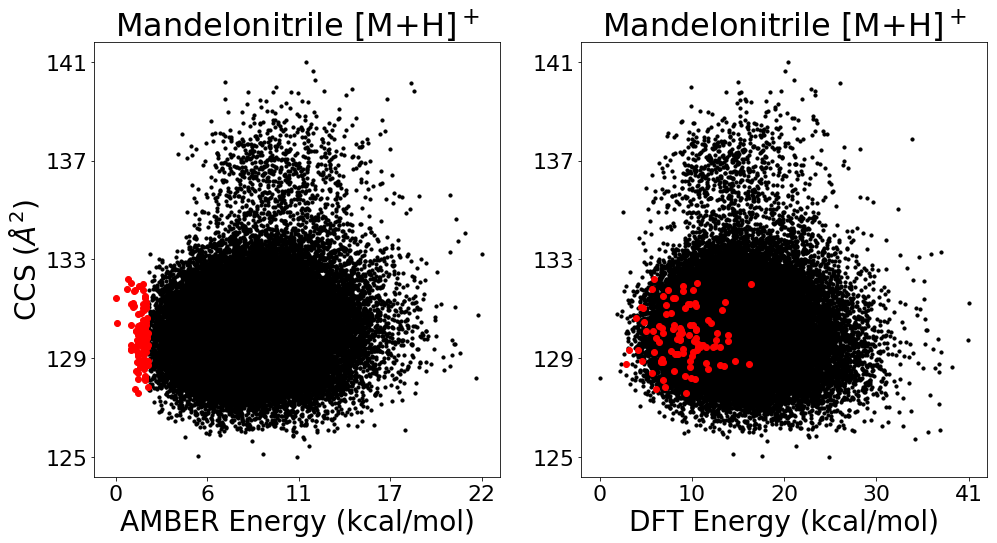

...

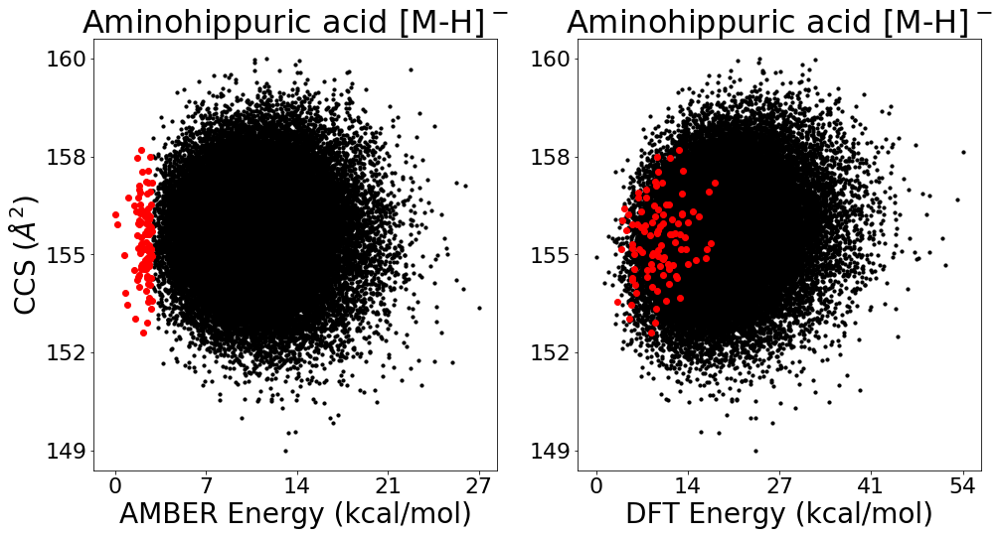

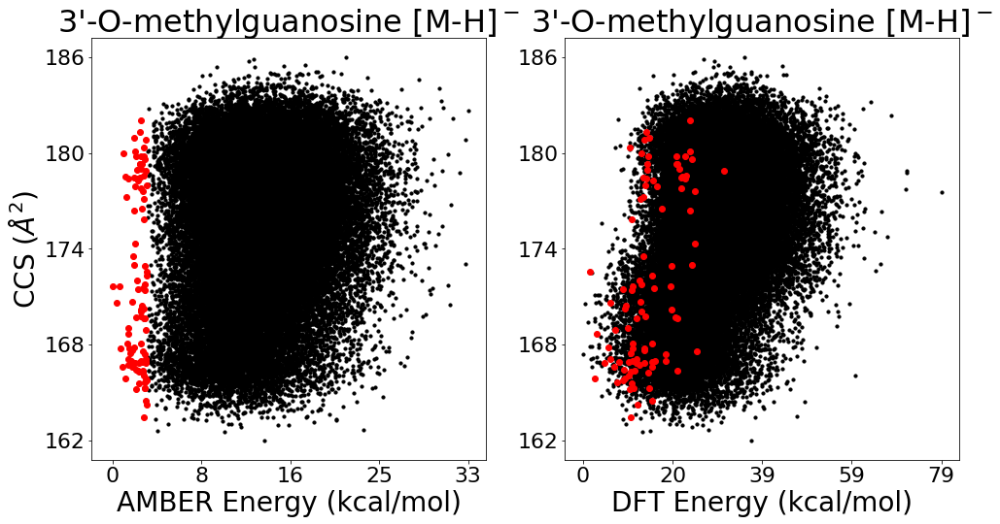

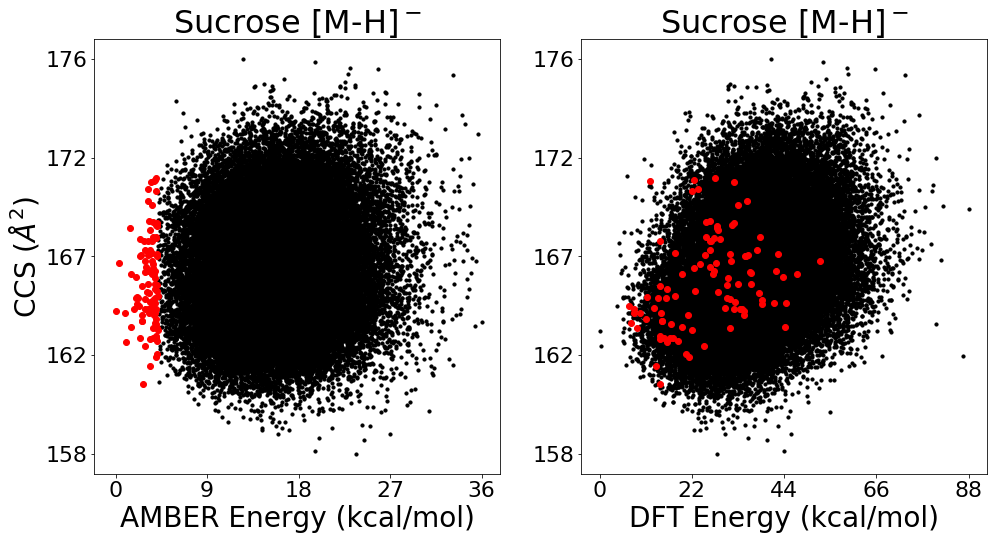

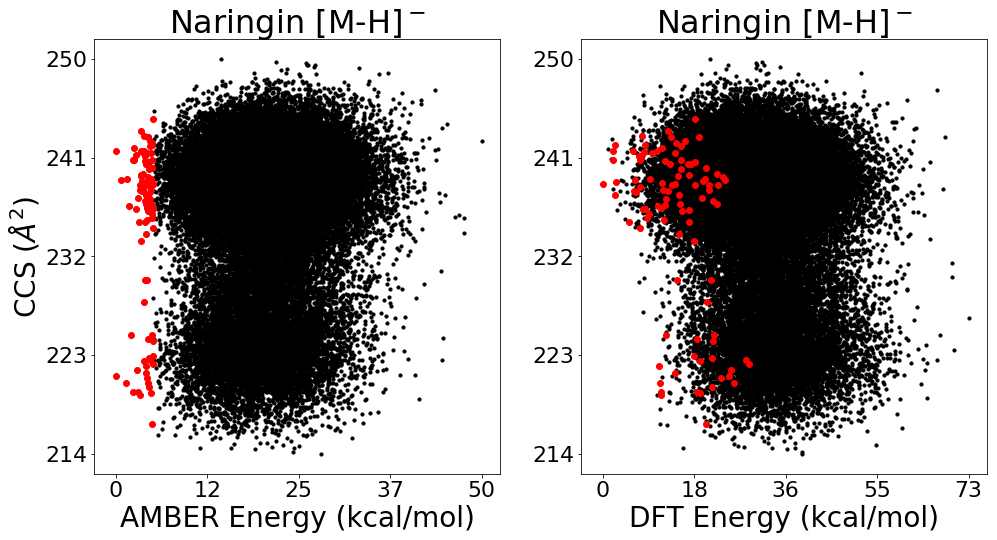

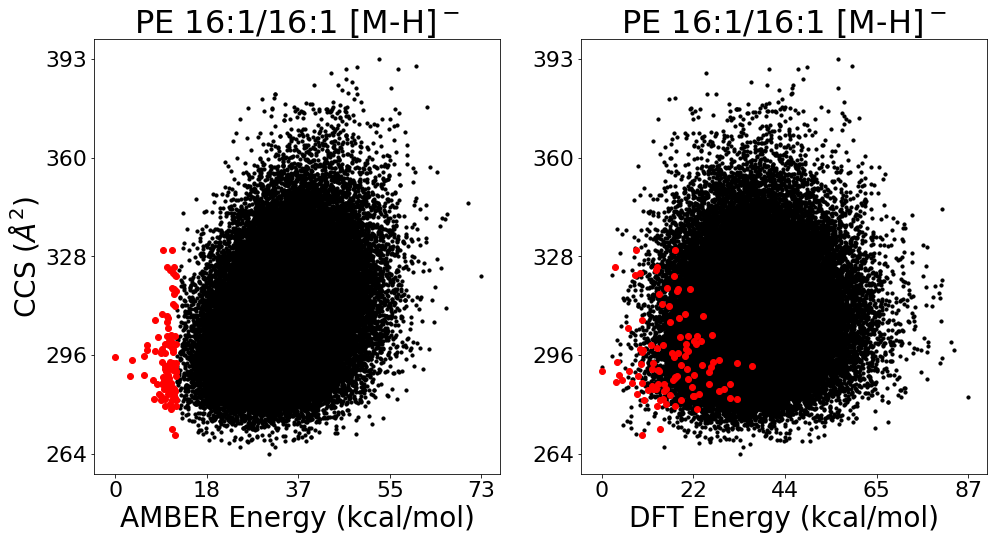

In [10]:
# Plot with energy division lines for selection technique demonstration


# Plot CCS v MD Energy
for d, ID in enumerate(molids[:]): 
    plt.figure(figsize=(16,8))

    file = f'../data/molid{ID}{adducts[d]}_amber_dft_ccs.csv'
    ###file_dft = f'../data/molid{ID}_ccs.csv'
    
    if os.path.exists(file):
        pass
    else:
        continue
        
    md_df = pd.read_csv(file)
    ###dft_df = pd.read_csv(file_dft)
    
    # Set the minimum energy to 0 and scale the rest accordingly.
    # Comment these out to restore specific Gibb's energy values
    # Which are apparently mostly arbitrary, you can't compare them across molecules
    mn = md_df['EPtot'].min()
    md_df['EPtot'] = md_df['EPtot'] - mn
    
    x = md_df['EPtot']
    y = md_df['ccs']
    
        
    md_df['dft_energy'] *= 627.509
    mn = md_df['dft_energy'].min()
    md_df['dft_energy'] -= mn #md_df['dft_energy'] - mn
    
    x2 = md_df['dft_energy']
    y2 = md_df['ccs']


    axMD = plt.subplot(1,2,1)

    # Generate color by density
#    xy = np.vstack([x,y])
#    z = gaussian_kde(xy)(xy)
    z = 'black'

    # the scatter plot:
    plt.scatter(x, y, c=z, s=10)

    #axMD.set_xlim((np.min(x)-0.0015,np.max(x)+0.0015))
#    axMD.set_xlim((np.min(x)-1,np.max(x)+1))
#    axMD.set_ylim((np.min(y)-1,np.max(y)+1))
    #plt.xlim((np.min(x)-1,np.max(x)+1))
    #plt.ylim((np.min(y)-1,np.max(y)+1))
    plt.ylabel('CCS ($\AA^2$)', fontsize=28)
    plt.xlabel('AMBER Energy (kcal/mol)', fontsize=28)


    # Adjust tick sizes and fonts
    axMD.tick_params(axis='both', which='major', labelsize=22)

    axMD.xaxis.set_major_formatter(FormatStrFormatter('%0.0f'))
    axMD.yaxis.set_major_formatter(FormatStrFormatter('%0.0f'))


    #xtic = np.linspace(np.min(x)-0.01, np.max(x)+0.01, 3) # For using real Gibb's values
    xtic = np.linspace(np.min(x), np.max(x), 5)
    ytic = np.linspace(np.min(y), np.max(y), 5)
    plt.xticks(xtic)
    plt.yticks(ytic)

    # Plot a random confomer as red dot
    #index = [24839,9,8362]
    index = np.argsort(x)[:100]
    plt.scatter(x[index], y[index], c='red')
    
    plt.title(f'{names[d]} [M{adducts[d]}]$^{adducts[d][0]}$', fontsize=32)
    
    #########
    ##
    ## Plot DFT
    ##
    ####
    
    axDFT = plt.subplot(1,2,2)

    # Generate color by density
#    xy2 = np.vstack([x2,y2])
#    z2 = gaussian_kde(xy2)(xy2)
    z2 = 'black'

    # the scatter plot:
    plt.scatter(x2, y2, c=z2, s=10)

    #axDFT.set_xlim((np.min(x)-0.0015,np.max(x)+0.0015))
#    axDFT.set_xlim((np.min(x)-1,np.max(x)+1))
#    axDFT.set_ylim((np.min(y)-1,np.max(y)+1))
    #plt.xlim((np.min(x)-1,np.max(x)+1))
    #plt.ylim((np.min(y)-1,np.max(y)+1))
    plt.xlabel('DFT Energy (kcal/mol)', fontsize=28)


    # Adjust tick sizes and fonts
    axDFT.tick_params(axis='both', which='major', labelsize=22)

    axDFT.xaxis.set_major_formatter(FormatStrFormatter('%0.0f'))
    axDFT.yaxis.set_major_formatter(FormatStrFormatter('%0.0f'))


    #xtic = np.linspace(np.min(x)-0.01, np.max(x)+0.01, 3) # For using real Gibb's values
    xtic = np.linspace(np.min(x2), np.max(x2), 5)
    ytic = np.linspace(np.min(y2), np.max(y2), 5)
    plt.xticks(xtic)
    plt.yticks(ytic)

    # Plot a random confomer as red dot
    plt.scatter(x2[index], y2[index], c='red')
    
    plt.title(f'{names[d]} [M{adducts[d]}]$^{adducts[d][0]}$', fontsize=32)    
    
    plt.show()

### Same as above but switched DFT and AMBER (EPtot) energy

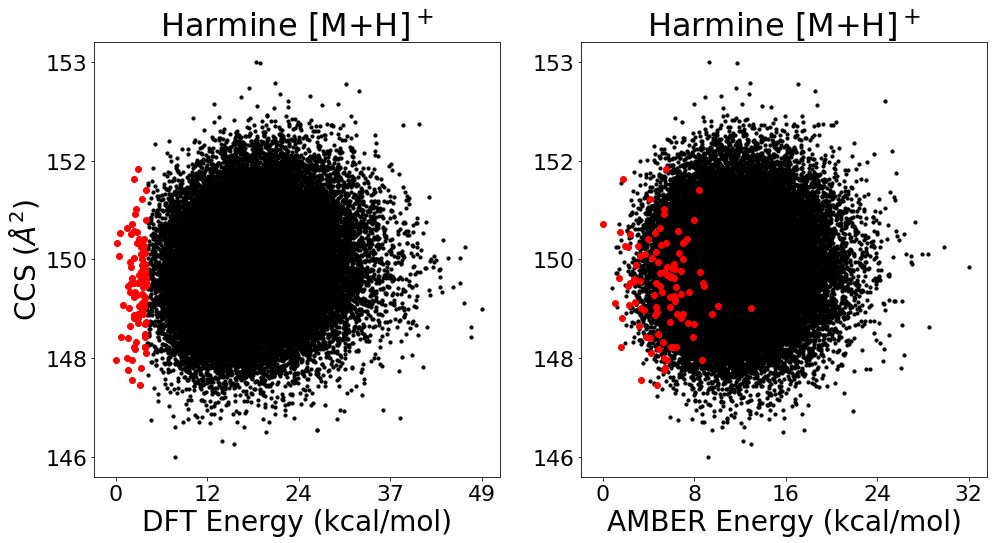

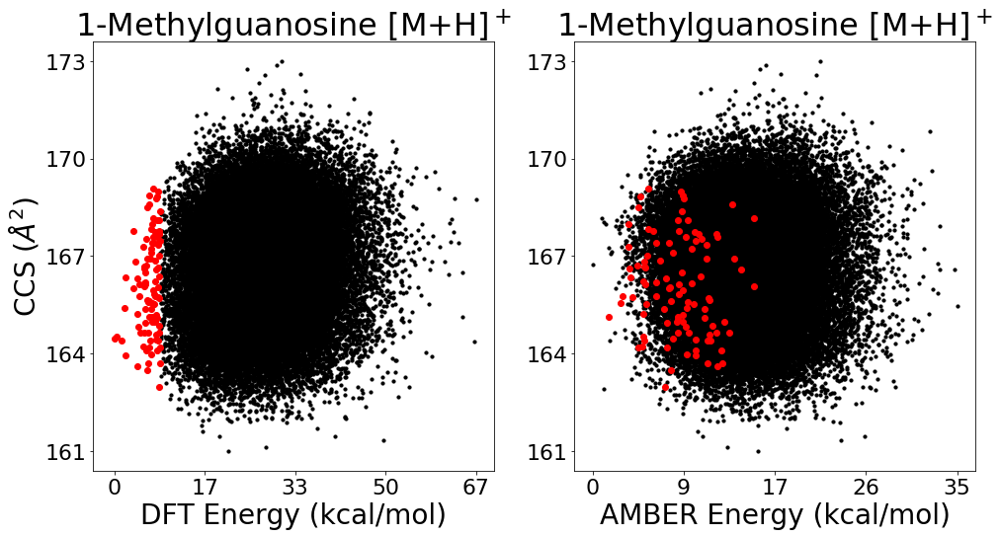

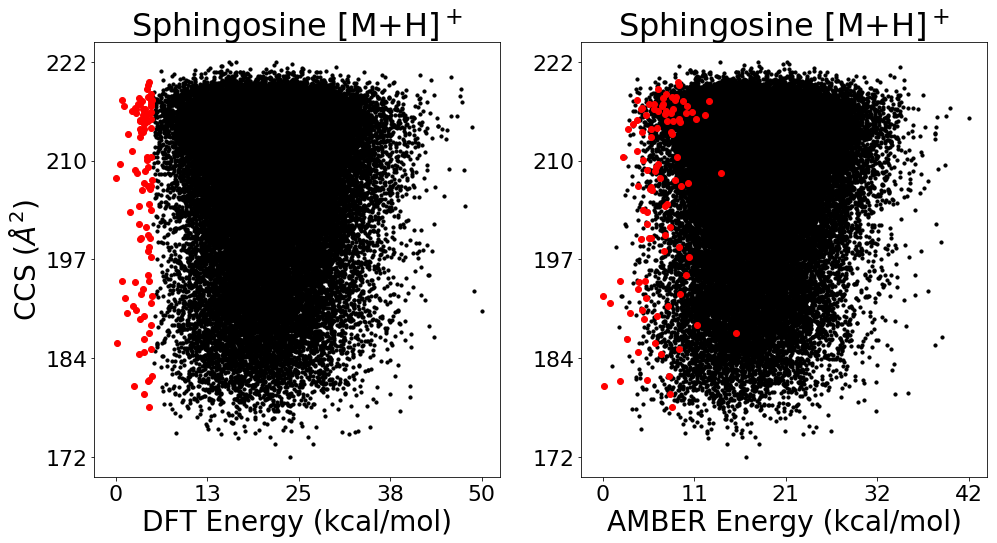

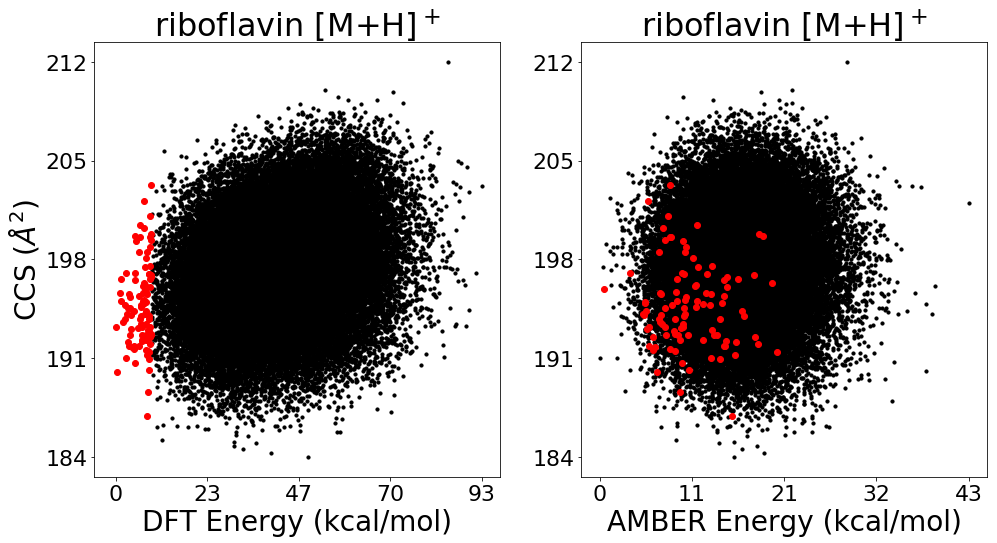

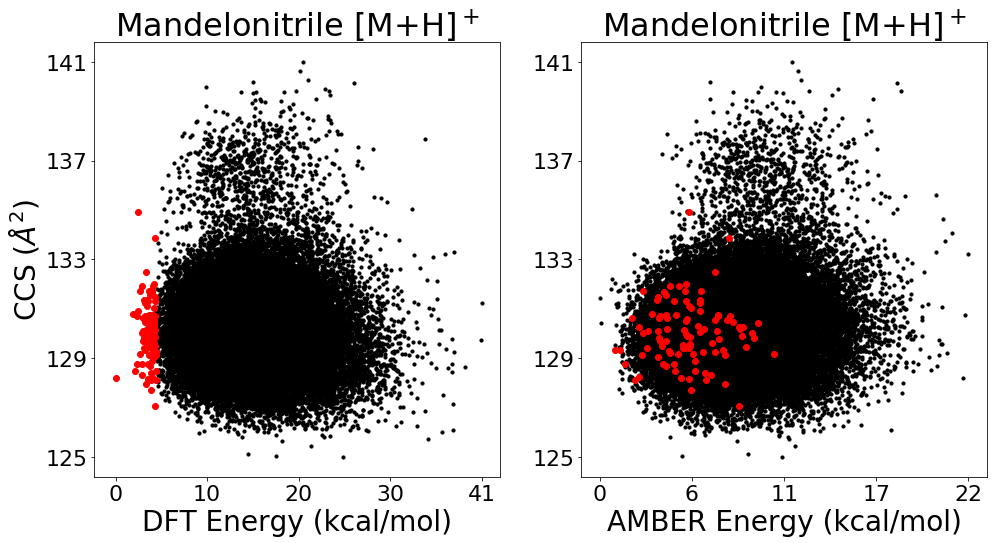

...

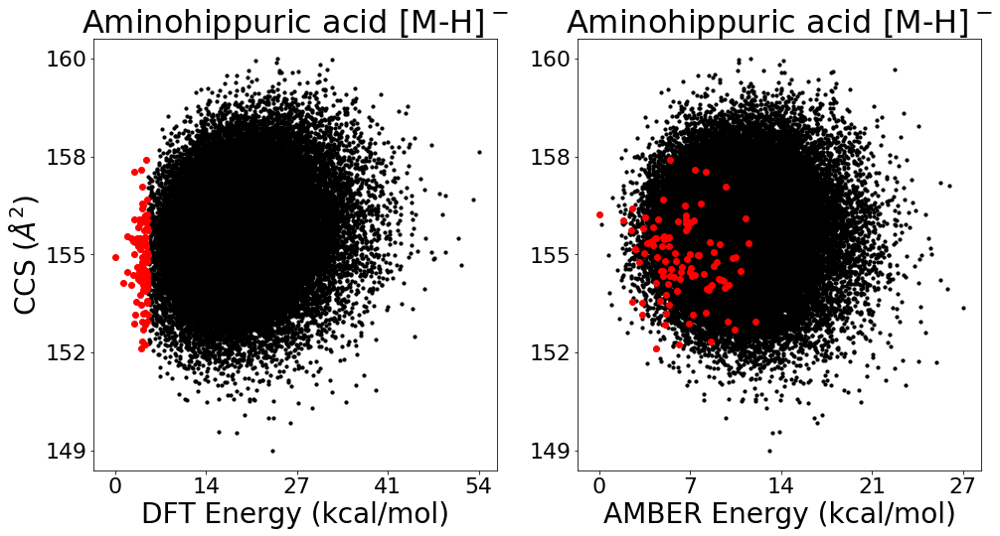

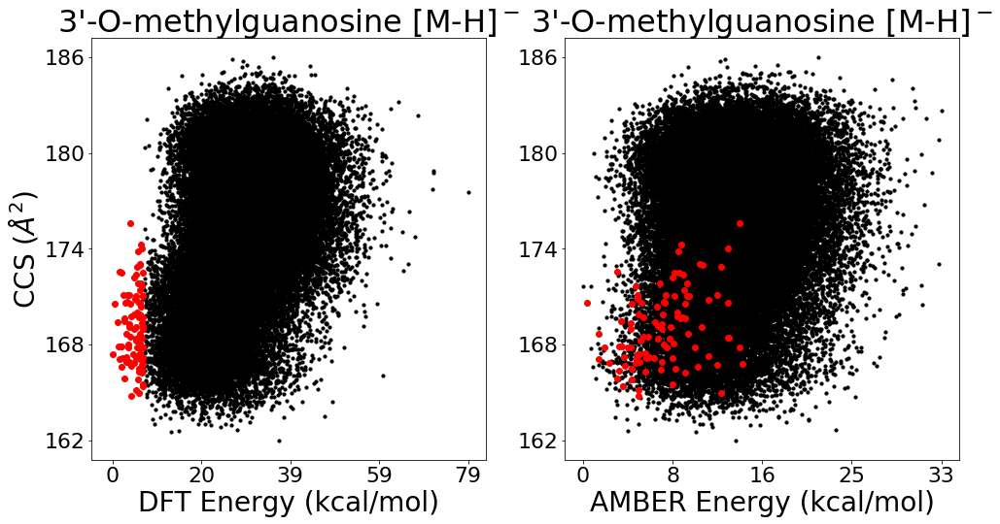

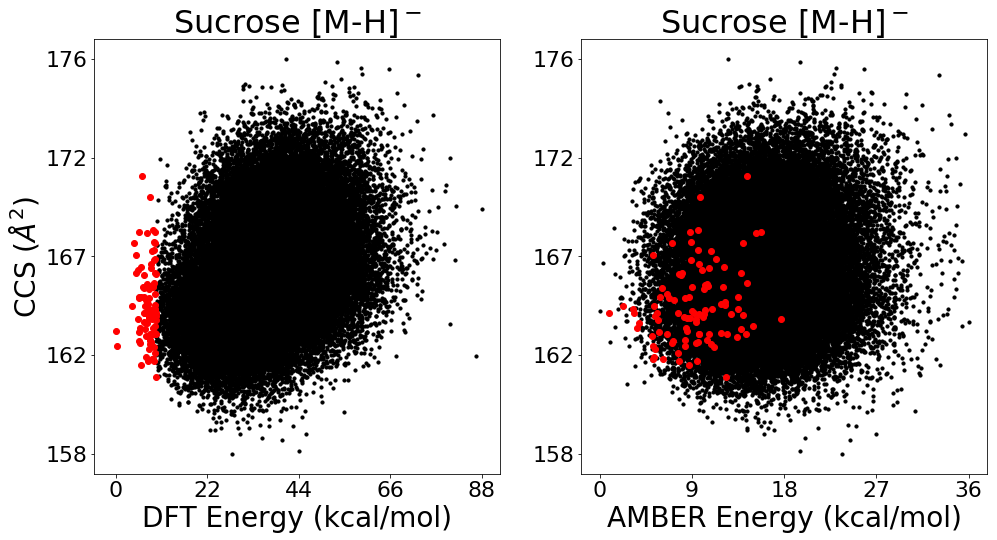

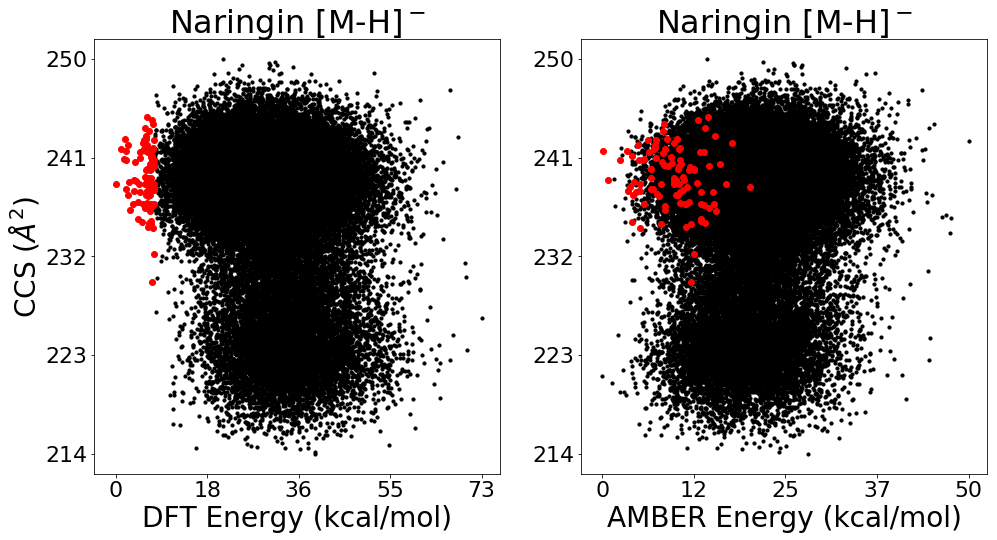

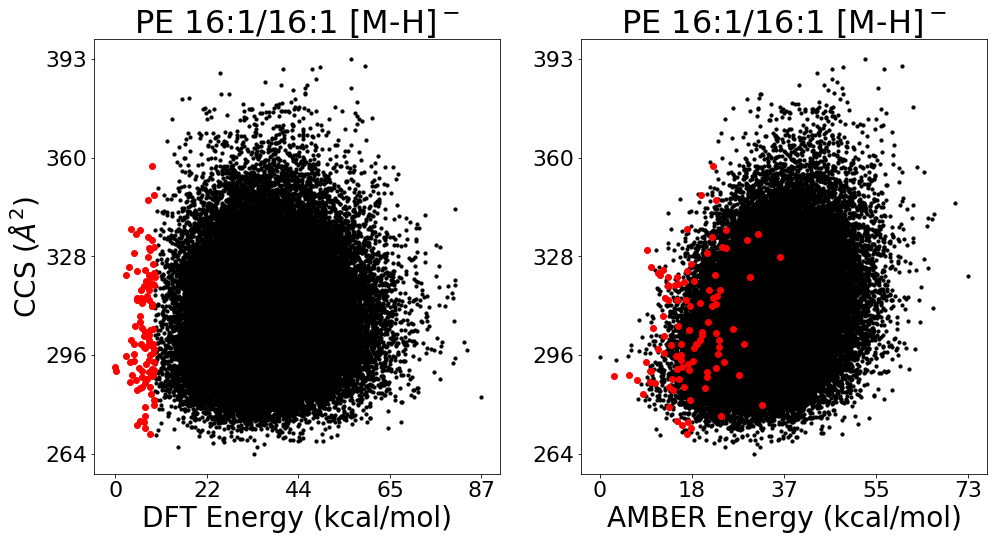

In [14]:
# Plot with energy division lines for selection technique demonstration


# Plot CCS v MD Energy
for d, ID in enumerate(molids[:]): 
    plt.figure(figsize=(16,8))

    file = f'../data/molid{ID}{adducts[d]}_amber_dft_ccs.csv'
    
    if os.path.exists(file):
        pass
    else:
        continue
        
    md_df = pd.read_csv(file)
    
    # Set the minimum energy to 0 and scale the rest accordingly.
    # Comment these out to restore specific Gibb's energy values
    # Which are apparently mostly arbitrary, you can't compare them across molecules
    mn = md_df['EPtot'].min()
    md_df['EPtot'] = md_df['EPtot'] - mn
    
    x2 = md_df['EPtot']
    y2 = md_df['ccs']
    
        
    md_df['dft_energy'] *= 627.509
    mn = md_df['dft_energy'].min()
    md_df['dft_energy'] -= mn #md_df['dft_energy'] - mn
    
    x = md_df['dft_energy']
    y = md_df['ccs']


    axMD = plt.subplot(1,2,1)

    # Generate color by density
#    xy = np.vstack([x,y])
#    z = gaussian_kde(xy)(xy)
    z = 'black'

    # the scatter plot:
    plt.scatter(x, y, c=z, s=10)

    #axMD.set_xlim((np.min(x)-0.0015,np.max(x)+0.0015))
#    axMD.set_xlim((np.min(x)-1,np.max(x)+1))
#    axMD.set_ylim((np.min(y)-1,np.max(y)+1))
    #plt.xlim((np.min(x)-1,np.max(x)+1))
    #plt.ylim((np.min(y)-1,np.max(y)+1))
    plt.ylabel('CCS ($\AA^2$)', fontsize=28)
    plt.xlabel('DFT Energy (kcal/mol)', fontsize=28)


    # Adjust tick sizes and fonts
    axMD.tick_params(axis='both', which='major', labelsize=22)

    axMD.xaxis.set_major_formatter(FormatStrFormatter('%0.0f'))
    axMD.yaxis.set_major_formatter(FormatStrFormatter('%0.0f'))


    #xtic = np.linspace(np.min(x)-0.01, np.max(x)+0.01, 3) # For using real Gibb's values
    xtic = np.linspace(np.min(x), np.max(x), 5)
    ytic = np.linspace(np.min(y), np.max(y), 5)
    plt.xticks(xtic)
    plt.yticks(ytic)

    # Plot a random confomer as red dot
    #index = [24839,9,8362]
    index = np.argsort(x)[:100]
    plt.scatter(x[index], y[index], c='red')
    
    plt.title(f'{names[d]} [M{adducts[d]}]$^{adducts[d][0]}$', fontsize=32)
    
    #########
    ##
    ## Plot DFT
    ##
    ####
    
    axDFT = plt.subplot(1,2,2)

    # Generate color by density
#    xy2 = np.vstack([x2,y2])
#    z2 = gaussian_kde(xy2)(xy2)
    z2 = 'black'

    # the scatter plot:
    plt.scatter(x2, y2, c=z2, s=10)

    #axDFT.set_xlim((np.min(x)-0.0015,np.max(x)+0.0015))
#    axDFT.set_xlim((np.min(x)-1,np.max(x)+1))
#    axDFT.set_ylim((np.min(y)-1,np.max(y)+1))
    #plt.xlim((np.min(x)-1,np.max(x)+1))
    #plt.ylim((np.min(y)-1,np.max(y)+1))
    plt.xlabel('AMBER Energy (kcal/mol)', fontsize=28)


    # Adjust tick sizes and fonts
    axDFT.tick_params(axis='both', which='major', labelsize=22)

    axDFT.xaxis.set_major_formatter(FormatStrFormatter('%0.0f'))
    axDFT.yaxis.set_major_formatter(FormatStrFormatter('%0.0f'))


    #xtic = np.linspace(np.min(x)-0.01, np.max(x)+0.01, 3) # For using real Gibb's values
    xtic = np.linspace(np.min(x2), np.max(x2), 5)
    ytic = np.linspace(np.min(y2), np.max(y2), 5)
    plt.xticks(xtic)
    plt.yticks(ytic)

    # Plot a random confomer as red dot
    plt.scatter(x2[index], y2[index], c='red')
    
    plt.title(f'{names[d]} [M{adducts[d]}]$^{adducts[d][0]}$', fontsize=32)    
    
    plt.show()
    #plt.savefig('Harmine+H_ccs_v_energy.png', dpi=600)

## Amber (EPtot) cloud plots with min threshold lines and LE dot

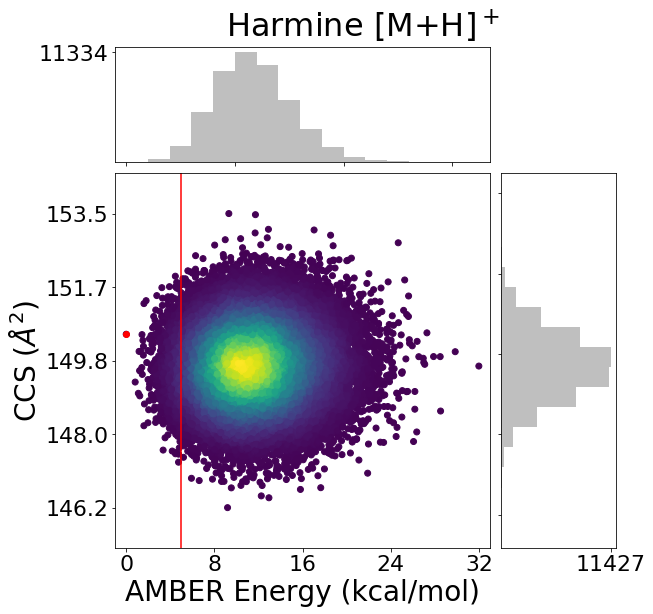

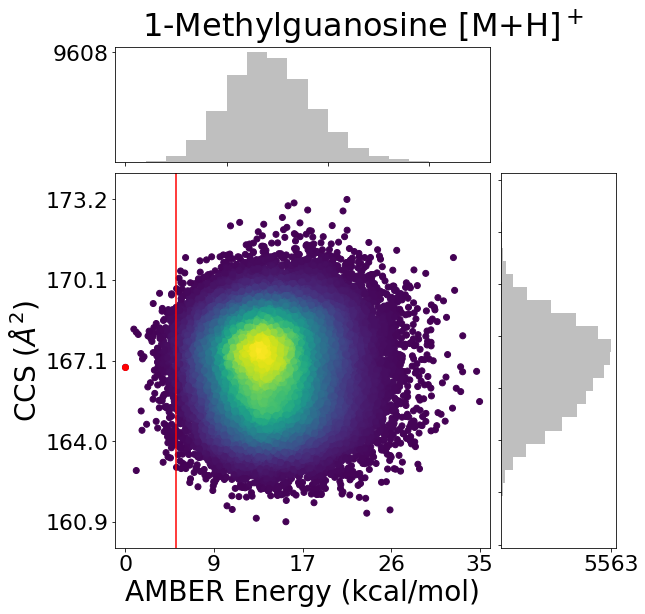

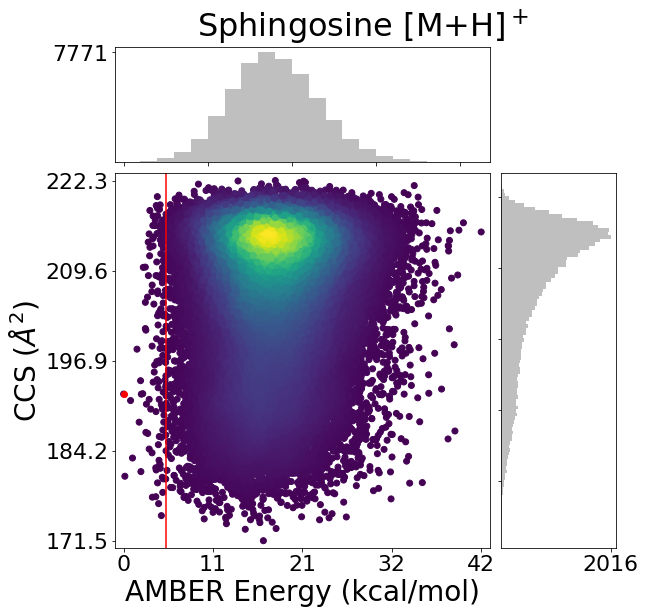

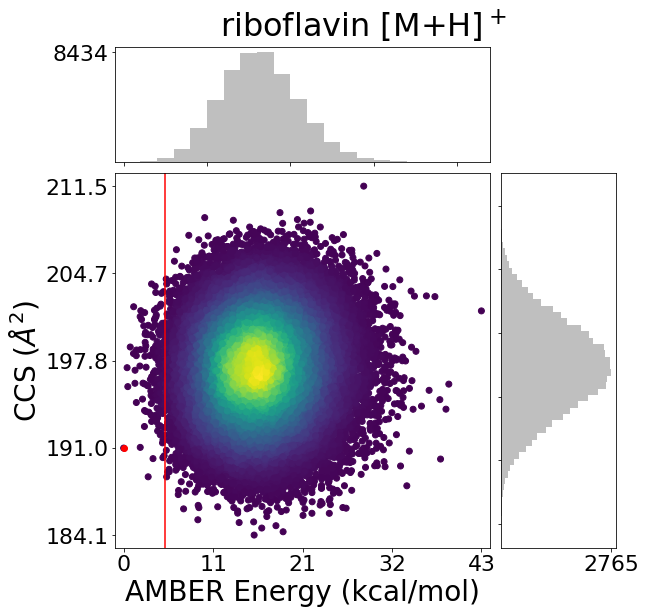

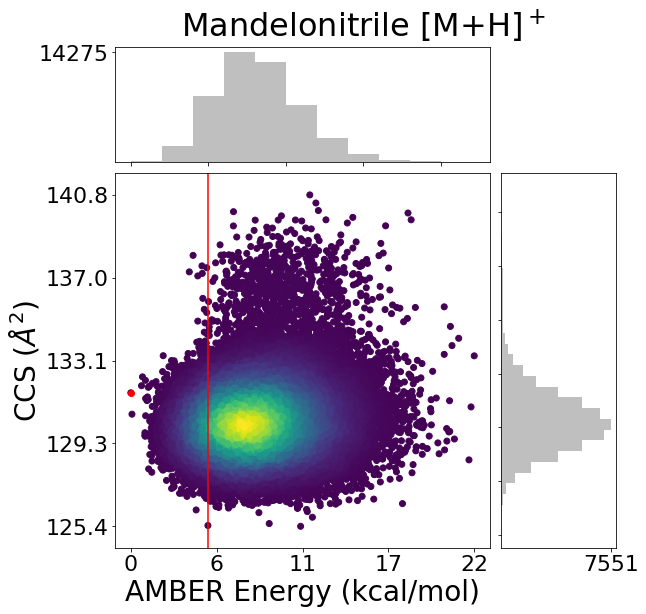

...

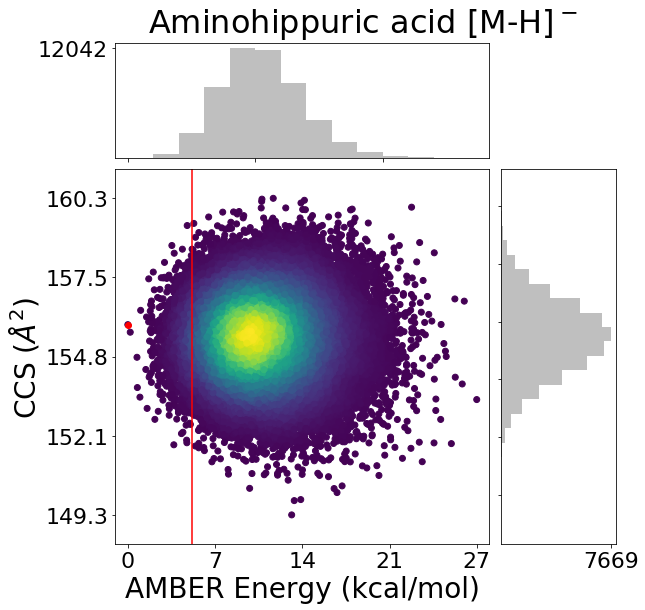

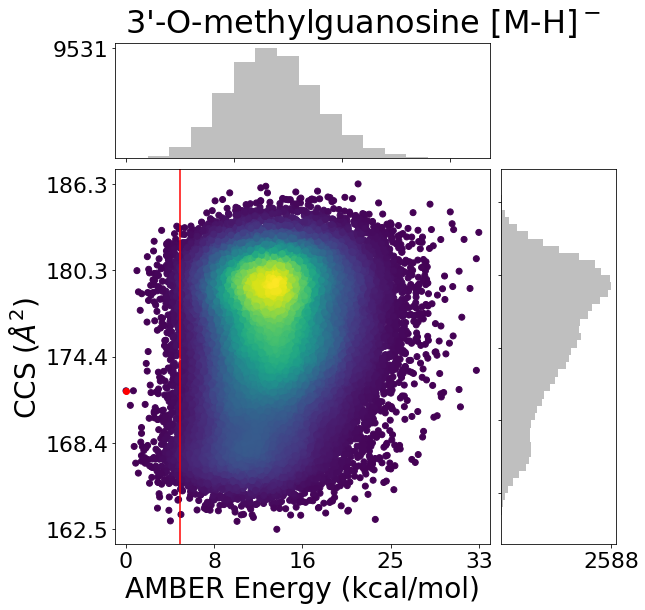

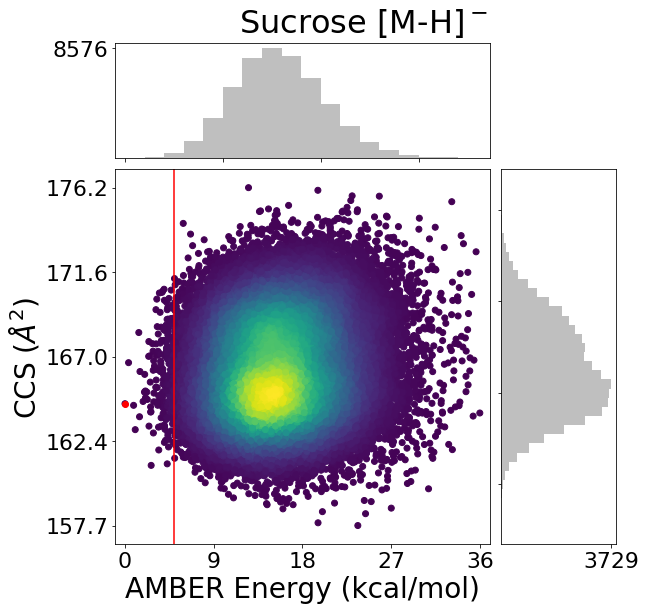

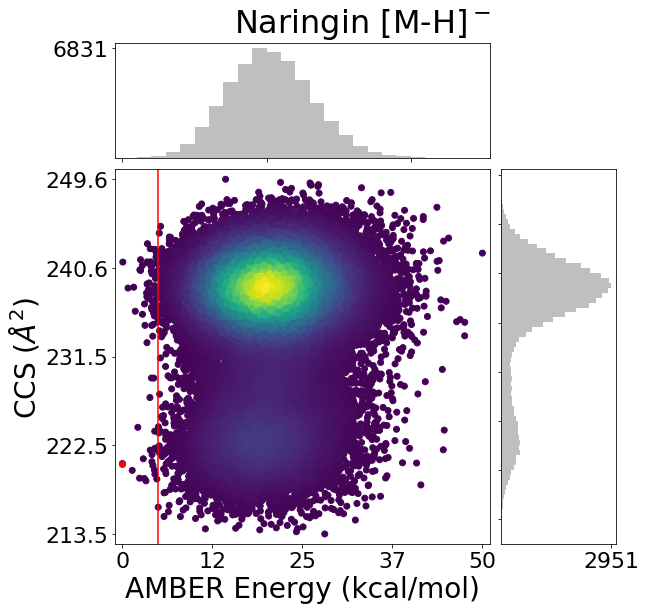

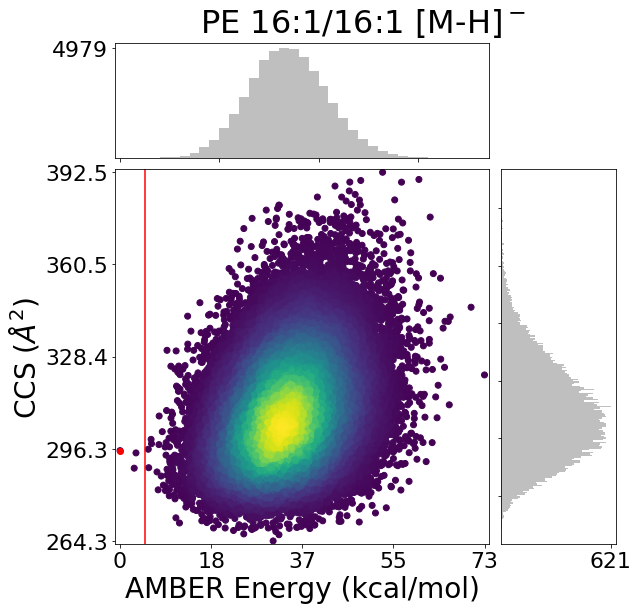

In [11]:
# Plot with energy division lines for selection technique demonstration

# Plot CCS v MD Energy
for d, ID in enumerate(molids[:]):   
    file = f'../data/molid{ID}{adducts[d]}_amber_dft_ccs.csv'
    
    if os.path.exists(file):
        pass
    else:
        continue
    
    evc_df = pd.read_csv(file)
    
    # Set the minimum energy to 0 and scale the rest accordingly.
    # Comment these out to restore specific Gibb's energy values
    # Which are apparently mostly arbitrary, you can't compare them across molecules
    min = evc_df['EPtot'].min()
    evc_df['EPtot'] = evc_df['EPtot'] - min
    
    x = evc_df['EPtot']
    y = evc_df['ccs']

    nullfmt = NullFormatter()

    # Define the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02

    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]


    plt.figure(1, figsize=(8, 8))

    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)

    # no labels
    axHistx.xaxis.set_major_formatter(nullfmt)
    axHisty.yaxis.set_major_formatter(nullfmt)

    # Generate color by density
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
#    z = 'black'
    # the scatter plot:
    axScatter.scatter(x, y, c=z)

    binwidth = 0.25

    #axScatter.set_xlim((np.min(x)-0.0015,np.max(x)+0.0015))
    axScatter.set_xlim((np.min(x)-1,np.max(x)+1))
    axScatter.set_ylim((np.min(y)-1,np.max(y)+1))
    axScatter.set_ylabel('CCS ($\AA^2$)', fontsize=28)
    axScatter.set_xlabel('AMBER Energy (kcal/mol)', fontsize=28)

    binwidthx = 2
    binwidthy = 0.5
    binx = np.arange(np.min(x), np.max(x), binwidthx)
    biny = np.arange(np.min(y), np.max(y), binwidthy)
    hxy, hxx, _ = axHistx.hist(x, bins=binx, color='#bfbfbf')
    hyy, hyx, _ = axHisty.hist(y, bins=biny, orientation='horizontal', color='#bfbfbf')

    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())
    #axHistx.set_xticklabels(x_ticks, rotation=0, fontsize=12)
    #axHisty.set_yticklabels(y_ticks, rotation=0, fontsize=2)


    # Adjust tick sizes and fonts
    axHistx.tick_params(axis='both', which='major', labelsize=22)
    axHisty.tick_params(axis='both', which='major', labelsize=22)
    axScatter.tick_params(axis='both', which='major', labelsize=22)

    axScatter.xaxis.set_major_formatter(FormatStrFormatter('%0.0f'))
    axScatter.yaxis.set_major_formatter(FormatStrFormatter('%0.1f'))


    #xtic = np.linspace(np.min(x)-0.01, np.max(x)+0.01, 3) # For using real Gibb's values
    xtic = np.linspace(np.min(x), np.max(x), 5)
    ytic = np.linspace(np.min(y), np.max(y), 5)
    axScatter.set_xticks(xtic)
    axScatter.set_yticks(ytic)

    axHistx.set_yticks([hxy.max()])
    axHisty.set_xticks([hyy.max()])
    
    # Now plot the energy division lines. Note that these are in kcal/mol,
     # shifted relative to the minimum energy which is set as 0
    #axScatter.axvline(0)
    axScatter.axvline(5, color='red')
    #axScatter.axvline(2, color='red')
    #axScatter.axvline(1, color='red')
    #axScatter.axvline(0.5, color='red')

    # Plot minimum energy conformer as specially colored dot
    index = x.idxmin()
    axScatter.scatter(x[index], y[index], c='red')
    
    plt.title(f'{names[d]} [M{adducts[d]}]$^{adducts[d][0]}$', fontsize=32, y=1.35, x=-1.2)
    plt.show()

### Amber energy (EPtot) vs DFT energy  

#### Also prints linear regression, r value information  

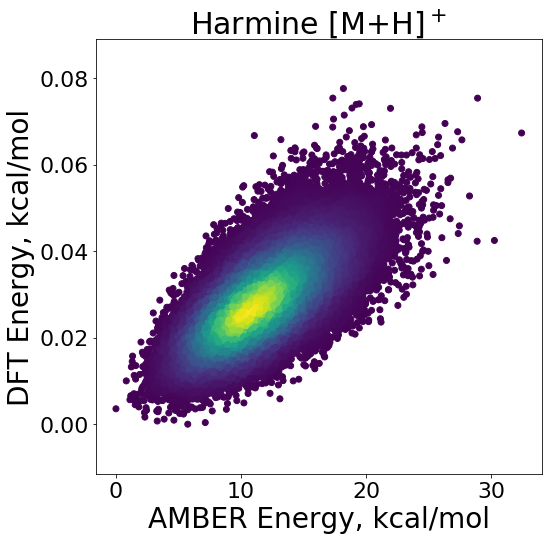

linregress:  LinregressResult(slope=0.0017283114227720799, intercept=0.008407226032829122, rvalue=0.6708485726455498, pvalue=0.0, stderr=8.544518639117323e-06)


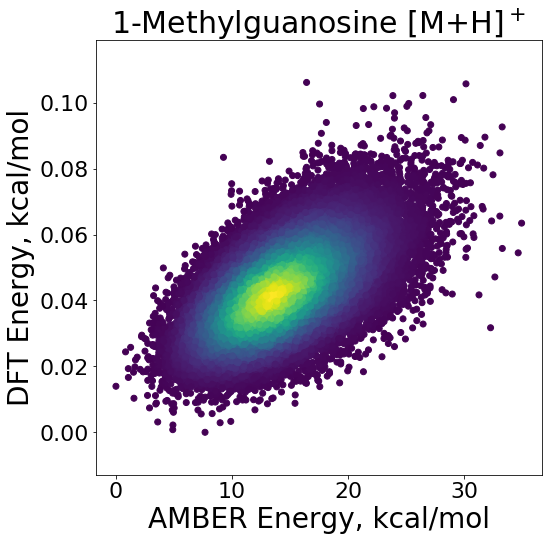

linregress:  LinregressResult(slope=0.0016495419311067044, intercept=0.01945922711186971, rvalue=0.57401378670017, pvalue=0.0, stderr=1.0526922762862763e-05)


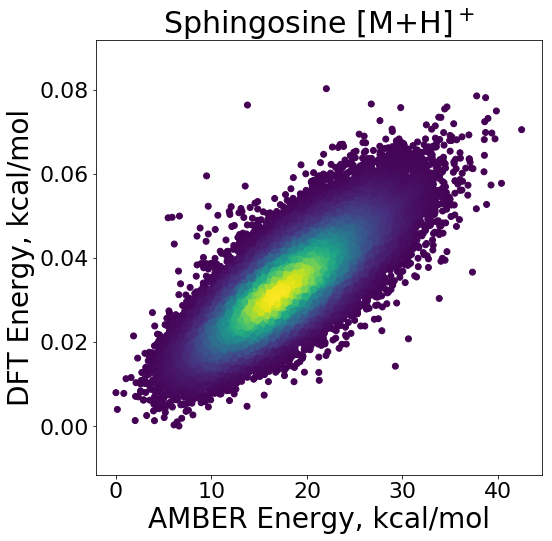

linregress:  LinregressResult(slope=0.0014865117788032494, intercept=0.006632410277345062, rvalue=0.7771845367821734, pvalue=0.0, stderr=5.38278228107061e-06)


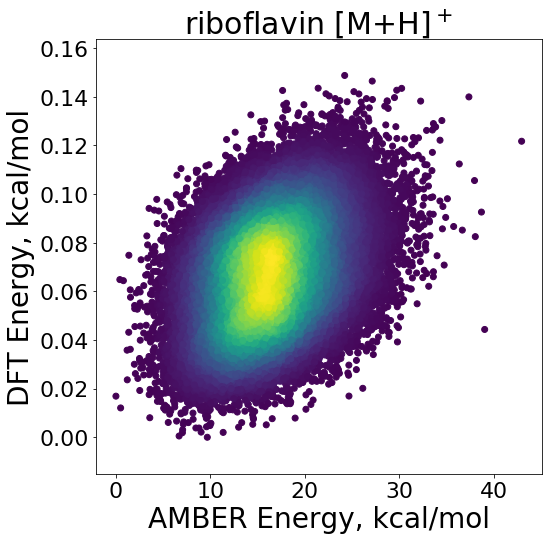

linregress:  LinregressResult(slope=0.0015859818298516234, intercept=0.04110252139453287, rvalue=0.3467851560454295, pvalue=0.0, stderr=1.9186852264703084e-05)


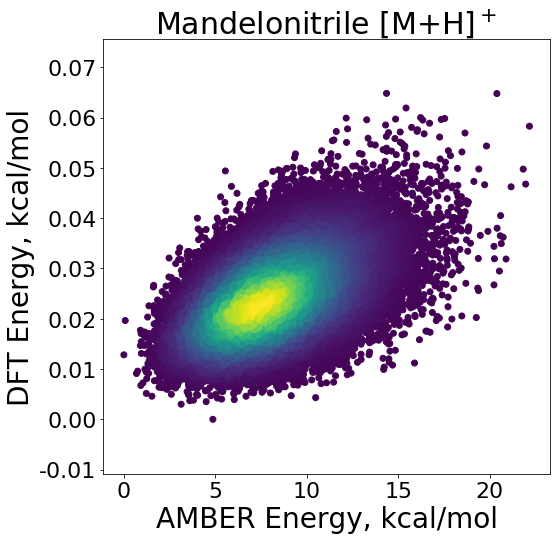

linregress:  LinregressResult(slope=0.001396658442067381, intercept=0.012781623006440918, rvalue=0.5144637556760103, pvalue=0.0, stderr=1.0411166220435e-05)


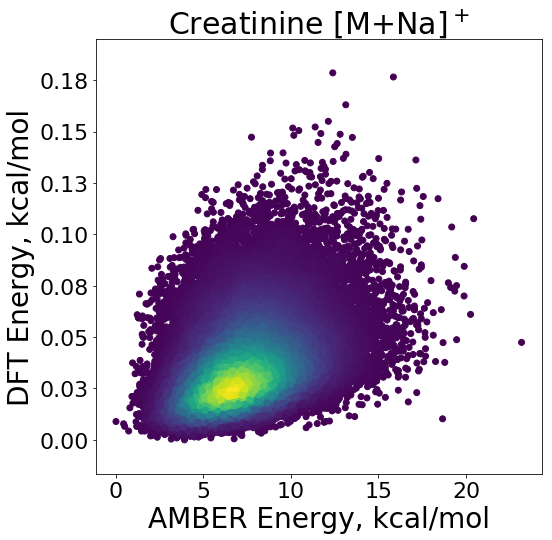

linregress:  LinregressResult(slope=0.0028398243046945547, intercept=0.016156214121514096, rvalue=0.3605013052067452, pvalue=0.0, stderr=3.286109038938309e-05)


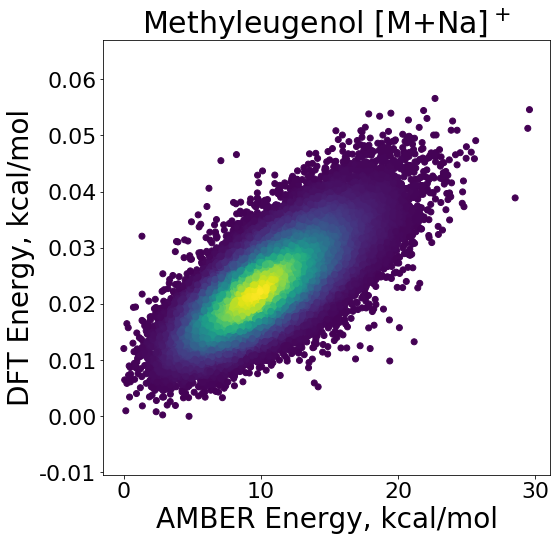

linregress:  LinregressResult(slope=0.001461990714010654, intercept=0.008054699809619743, rvalue=0.7291912101765472, pvalue=0.0, stderr=6.135921021651703e-06)


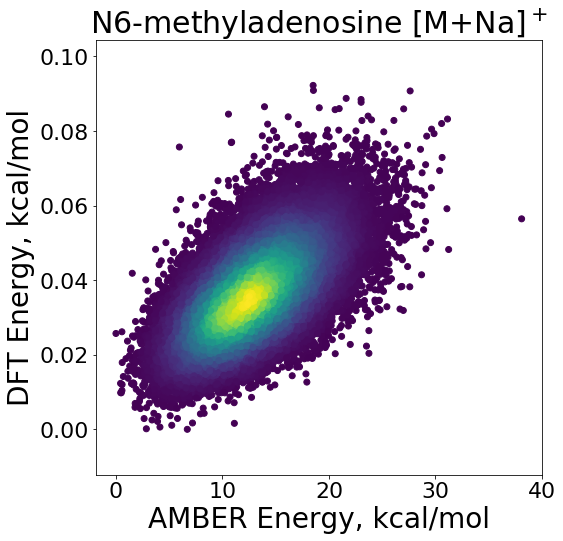

linregress:  LinregressResult(slope=0.0016728111195938378, intercept=0.01486053078473129, rvalue=0.6103375328208978, pvalue=0.0, stderr=9.709642914700217e-06)


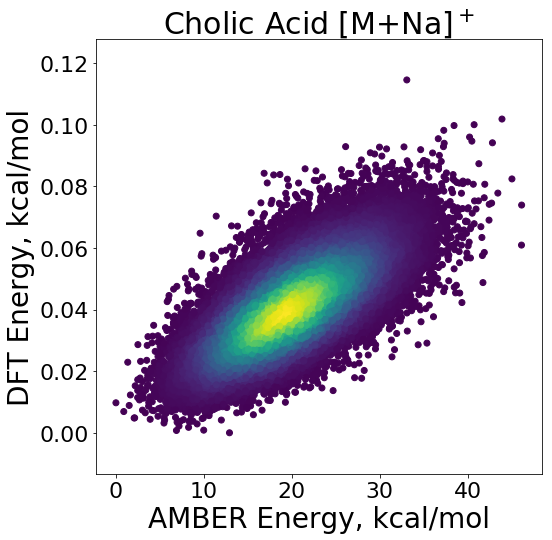

linregress:  LinregressResult(slope=0.001544537510232421, intercept=0.010020009155436549, rvalue=0.6981424937843672, pvalue=0.0, stderr=7.083797301622738e-06)


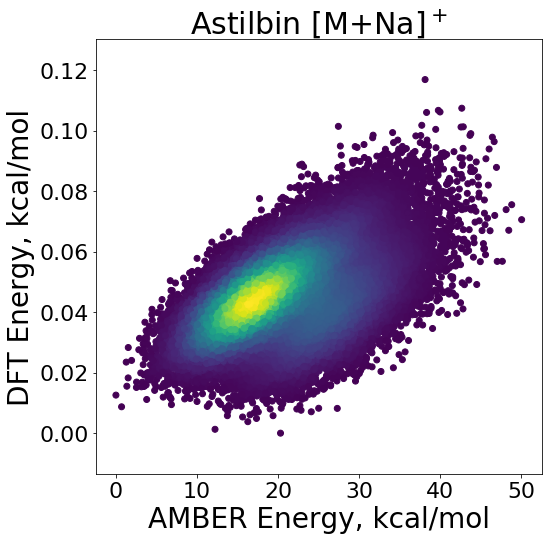

linregress:  LinregressResult(slope=0.0009232154806782698, intercept=0.026343072507696397, rvalue=0.49040056300188617, pvalue=0.0, stderr=7.3373928933705725e-06)


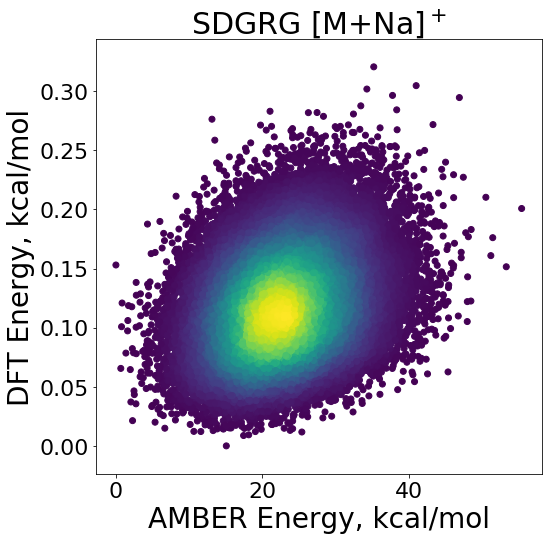

linregress:  LinregressResult(slope=0.00159827339659481, intercept=0.08204686689202567, rvalue=0.25622923533685676, pvalue=0.0, stderr=2.696551756190864e-05)


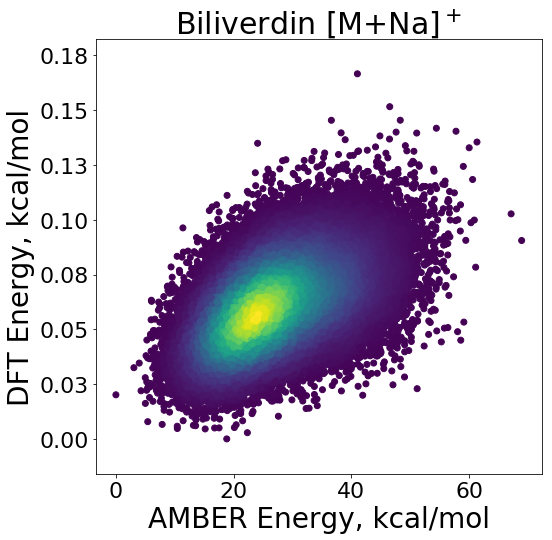

linregress:  LinregressResult(slope=0.0010909444145459253, intercept=0.03141183871642532, rvalue=0.5013161814375295, pvalue=0.0, stderr=8.433061369201952e-06)


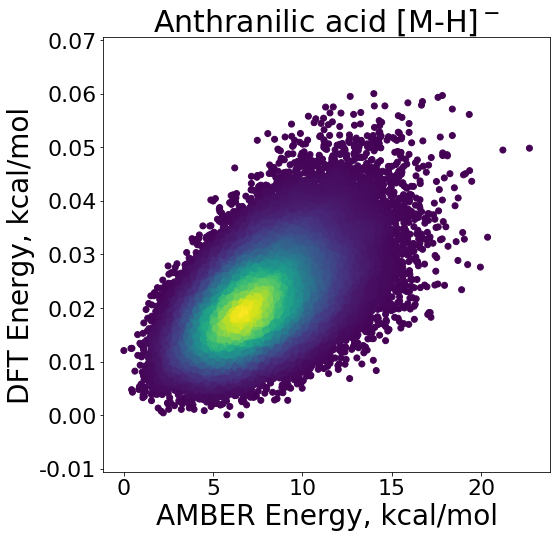

linregress:  LinregressResult(slope=0.0016152240007211898, intercept=0.009102672613001272, rvalue=0.5310760385371391, pvalue=0.0, stderr=1.152522276928506e-05)


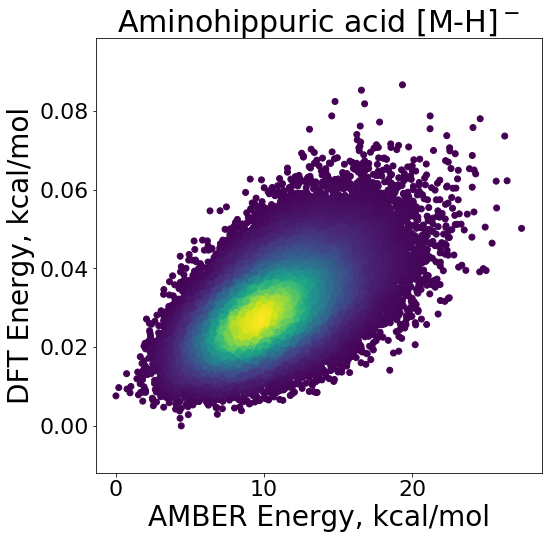

linregress:  LinregressResult(slope=0.0016851894086452924, intercept=0.012148730850102797, rvalue=0.5520950764357397, pvalue=0.0, stderr=1.1381791078368409e-05)


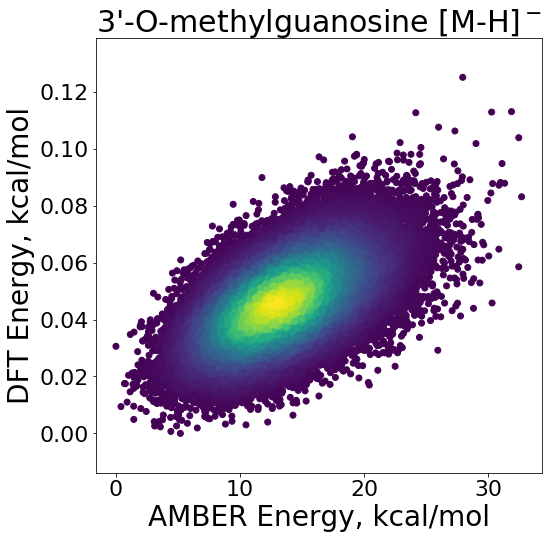

linregress:  LinregressResult(slope=0.0018044581317351106, intercept=0.02175283227279796, rvalue=0.5561733325604883, pvalue=0.0, stderr=1.2104540994816736e-05)


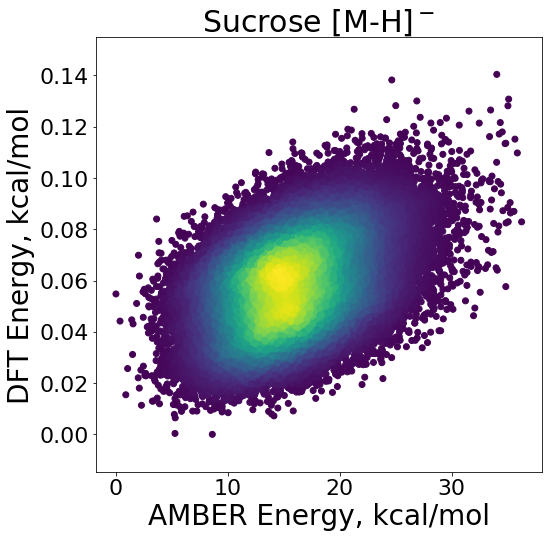

linregress:  LinregressResult(slope=0.0015313892576949942, intercept=0.03407493176085076, rvalue=0.40330718263239707, pvalue=0.0, stderr=1.5539072849188868e-05)


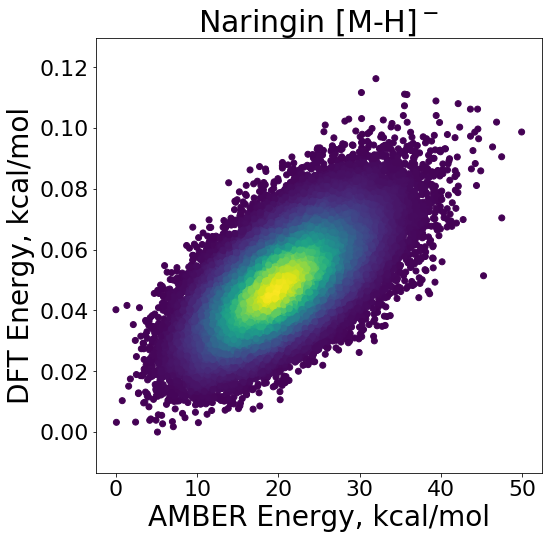

linregress:  LinregressResult(slope=0.001511106741330571, intercept=0.01803925463232494, rvalue=0.637798073191299, pvalue=0.0, stderr=8.16095870177121e-06)


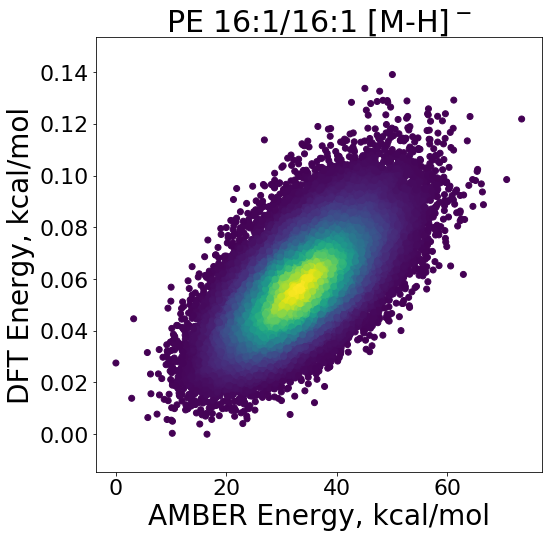

linregress:  LinregressResult(slope=0.0013577915003239462, intercept=0.012084504381715148, rvalue=0.6457547466316963, pvalue=0.0, stderr=7.179988364986912e-06)


In [12]:
# Plot MD vs DFT energy
for d, ID in enumerate(molids[:]):   
    file = f'../data/molid{ID}{adducts[d]}_amber_dft_ccs.csv'
    
    if os.path.exists(file):
        pass
    else:
        continue
    
    df = pd.read_csv(file)
    
    mn = df['EPtot'].min()
    df['EPtot'] = df['EPtot'] - mn
    
    mn = df['dft_energy'].min()
    df['dft_energy'] = df['dft_energy'] - mn

    x = df['EPtot']
    y = df['dft_energy']
    
    # Generate color by density
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
#    z = 'black'

    fig = plt.figure(1, figsize=(8, 8))
    ax = fig.add_subplot(111)    
    
    plt.scatter(x, y, c=z)
    plt.title(f'{names[d]} [M{adducts[d]}]$^{adducts[d][0]}$', fontsize=30)
    plt.xlabel('AMBER Energy, kcal/mol', fontsize=28)
    plt.ylabel('DFT Energy, kcal/mol', fontsize=28)

#    ytic = np.linspace(df['EPtot'].min(), 
#                       df['EPtot'].max(),
#                       5)
#    plt.yticks(ytic)
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    plt.tick_params(axis='both', which='major', labelsize=22)
    plt.show()

    #print('Pearson\'s correlation coefficient, and pvalue: ', pearsonr(x,y)) # r and pvalue
    #print('\n')
    print('linregress: ', linregress(x,y))
    
    

####   (fig numbers are a little arbitrary here because you could argue there are a lot. See powerpoint slides titled "cycle_clustering_in_cloud_Nielson2020" for some highlights.)  

### checking if AMBER cycles cluster or not using AMBER (EPtot) energy  

1


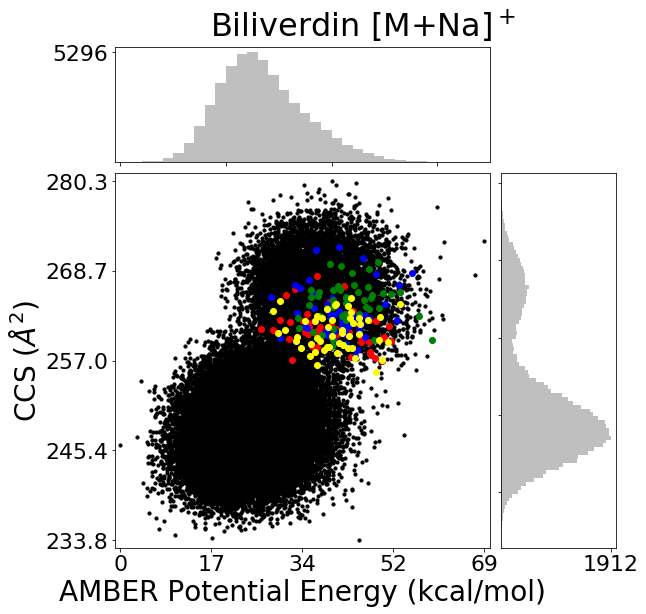

101


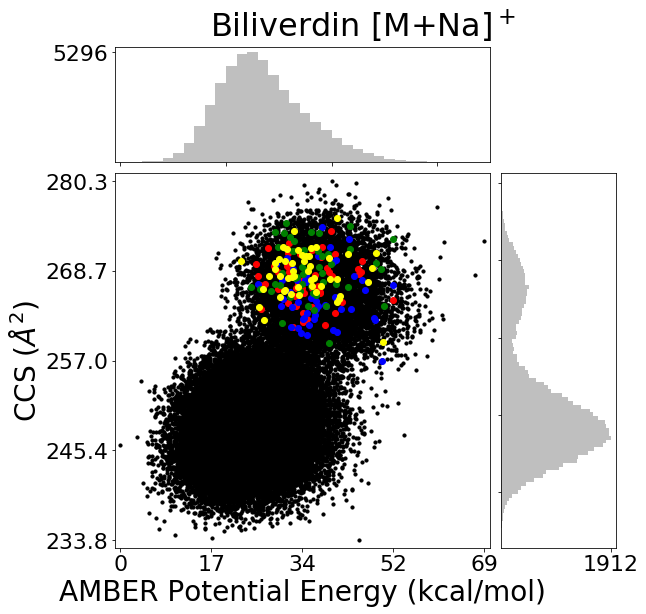

201


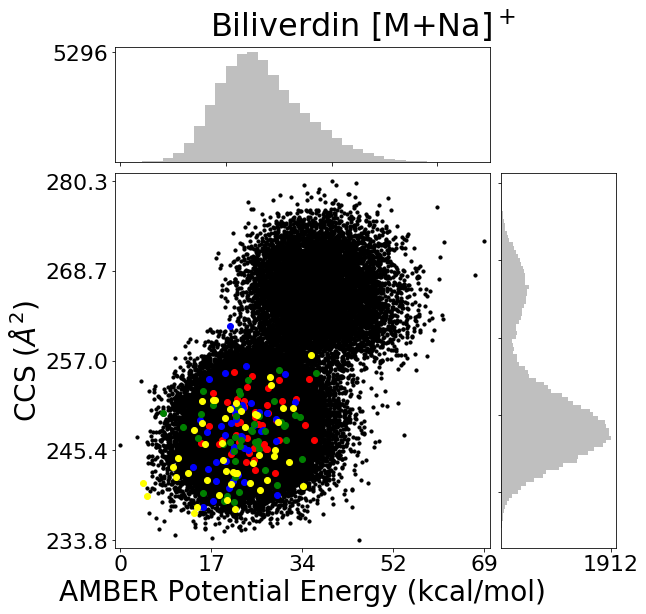

301


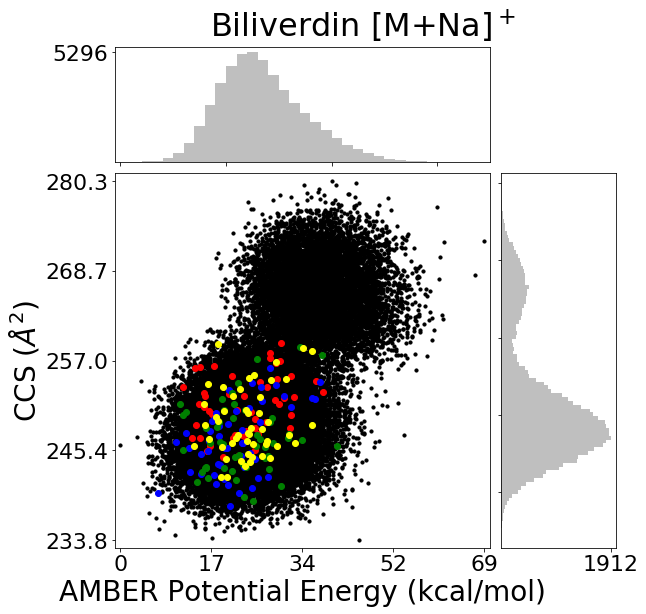

401


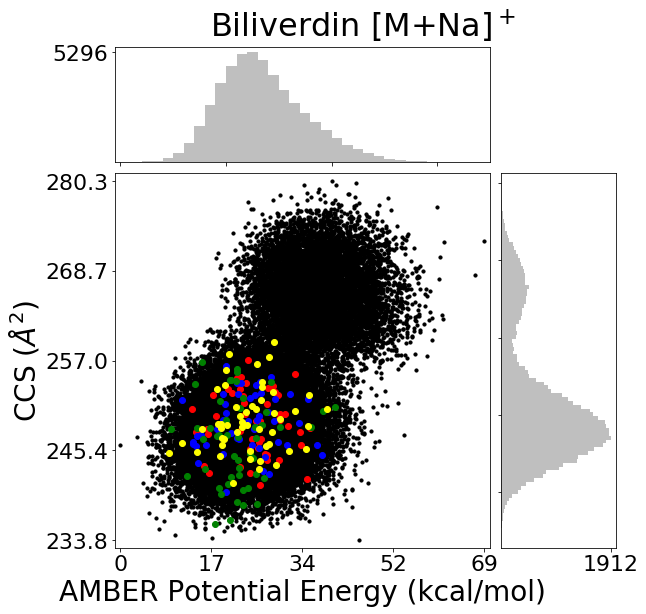

501


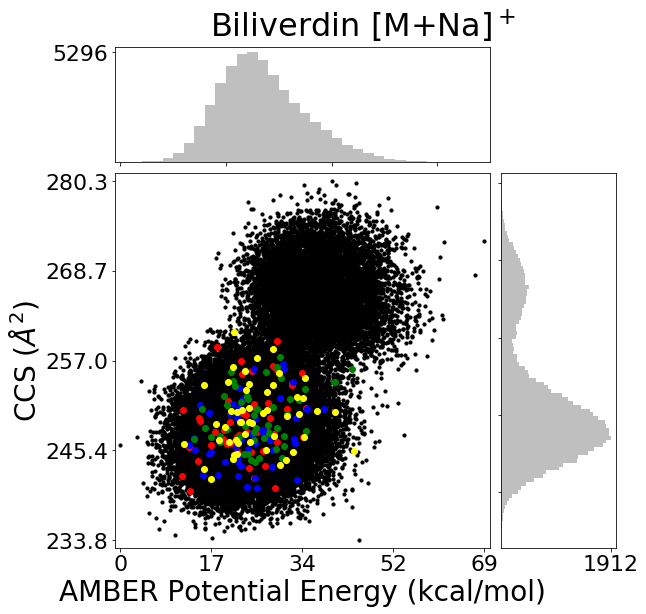

601


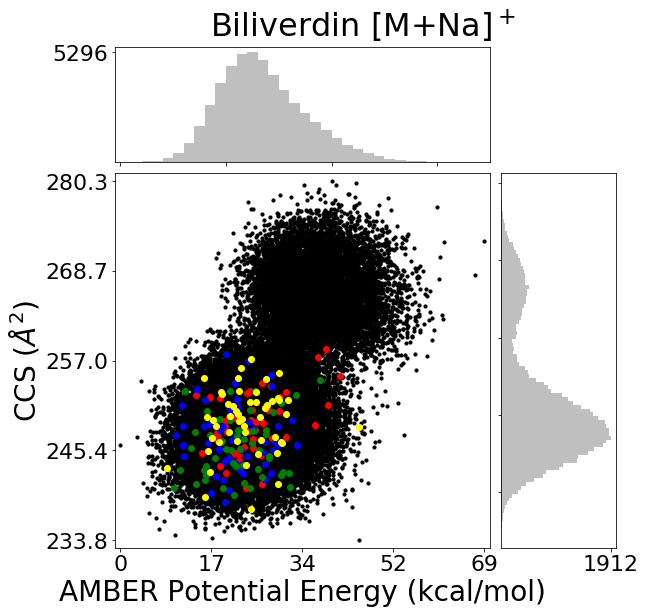

701


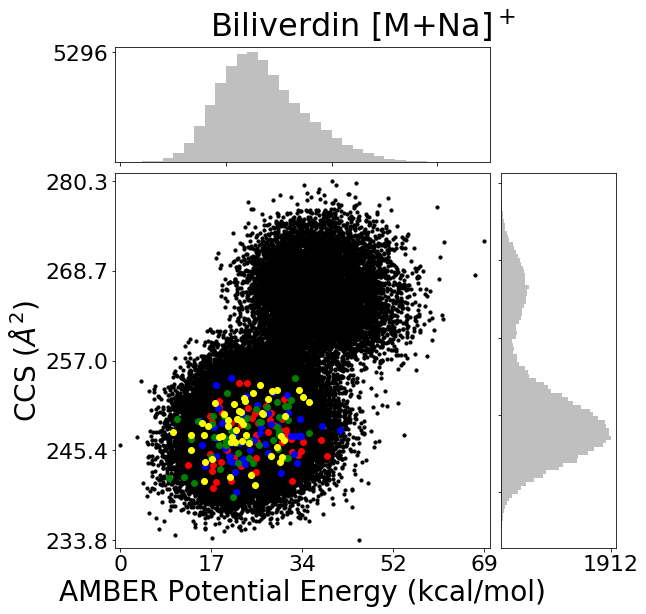

801


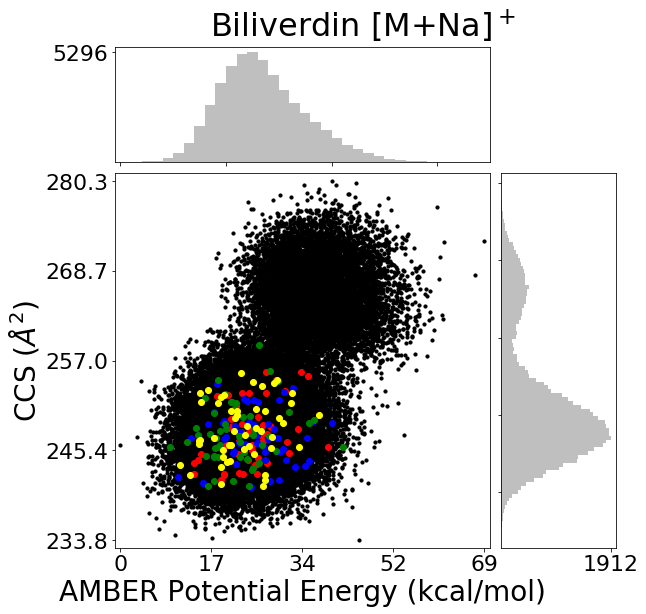

901


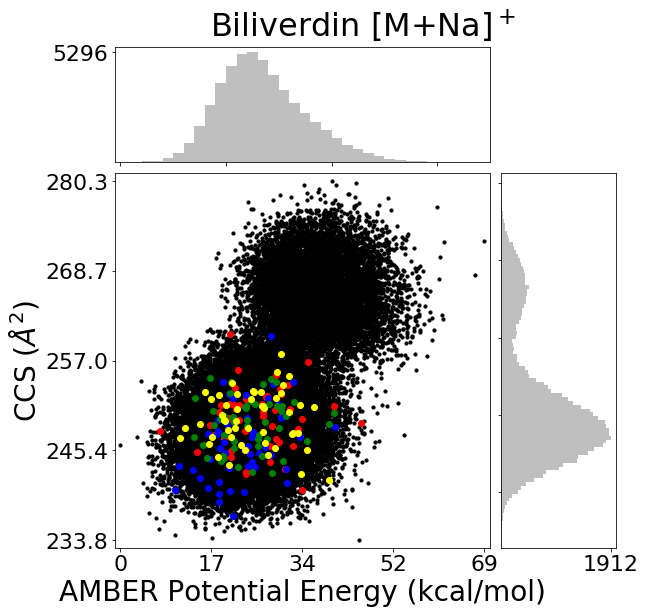

1001


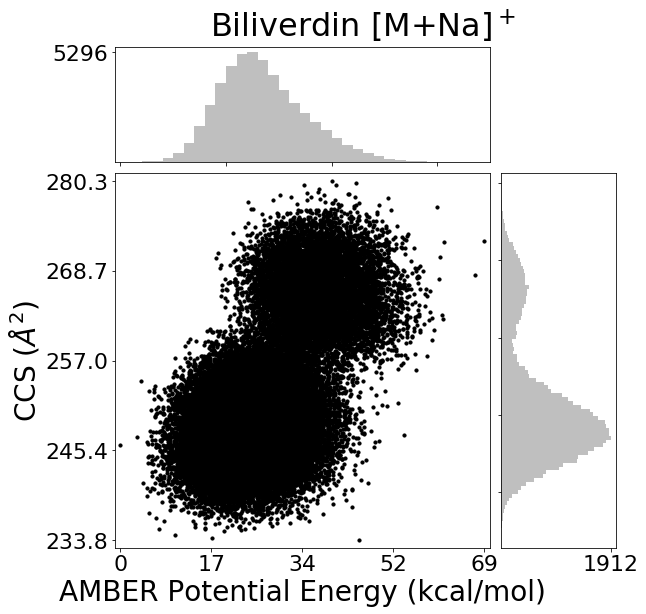

In [34]:
# Plot with energy division lines for selection technique demonstration

step = 100
cycles = np.arange(1, 1000+step, step)
for cycle in cycles:
    
    # Plot CCS v AMBER Potential Energy
    d=11
    # look at 3, 9, 10, 11 <-- fo sure, 14, 15, 16
    
    for ID in molids[d:d+1]:  
        file = f'../data/molid{ID}{adducts[d]}_amber_dft_ccs.csv'

        if os.path.exists(file):
            pass
        else:
            print(file, ' does not exist')
            continue

        df = pd.read_csv(file)

        # Set the minimum energy to 0 and scale the rest accordingly.
        # Comment these out to restore specific AMBER Potential Energy values
        # Which are apparently mostly arbitrary, you can't compare them across molecules
        #df['EPtot'] *= 627.509 # Convert hartree to kcal/mol 
        mn = df['EPtot'].min()
        df['EPtot'] = df['EPtot'] - mn

        x = df['EPtot']
        y = df['ccs']

        nullfmt = NullFormatter()

        # Define the axes
        left, width = 0.1, 0.65
        bottom, height = 0.1, 0.65
        bottom_h = left_h = left + width + 0.02

        rect_scatter = [left, bottom, width, height]
        rect_histx = [left, bottom_h, width, 0.2]
        rect_histy = [left_h, bottom, 0.2, height]


        plt.figure(1, figsize=(8, 8))

        axScatter = plt.axes(rect_scatter)
        axHistx = plt.axes(rect_histx)
        axHisty = plt.axes(rect_histy)

        # no labels
        axHistx.xaxis.set_major_formatter(nullfmt)
        axHisty.yaxis.set_major_formatter(nullfmt)

        # Generate color by density
    #    xy = np.vstack([x,y])
    #    z = gaussian_kde(xy)(xy)
        z = 'black'
        # the scatter plot:
        axScatter.scatter(x, y, c=z, s=10)

        binwidth = 0.25

        #axScatter.set_xlim((np.min(x)-0.0015,np.max(x)+0.0015))
        axScatter.set_xlim((np.min(x)-1,np.max(x)+1))
        axScatter.set_ylim((np.min(y)-1,np.max(y)+1))
        axScatter.set_ylabel('CCS ($\AA^2$)', fontsize=28)
        axScatter.set_xlabel('AMBER Potential Energy (kcal/mol)', fontsize=28)

        binwidthx = 2
        binwidthy = 0.5
        binx = np.arange(np.min(x), np.max(x), binwidthx)
        biny = np.arange(np.min(y), np.max(y), binwidthy)
        hxy, hxx, _ = axHistx.hist(x, bins=binx, color='#bfbfbf')
        hyy, hyx, _ = axHisty.hist(y, bins=biny, orientation='horizontal', color='#bfbfbf')

        axHistx.set_xlim(axScatter.get_xlim())
        axHisty.set_ylim(axScatter.get_ylim())
        #axHistx.set_xticklabels(x_ticks, rotation=0, fontsize=12)
        #axHisty.set_yticklabels(y_ticks, rotation=0, fontsize=2)


        # Adjust tick sizes and fonts
        axHistx.tick_params(axis='both', which='major', labelsize=22)
        axHisty.tick_params(axis='both', which='major', labelsize=22)
        axScatter.tick_params(axis='both', which='major', labelsize=22)

        axScatter.xaxis.set_major_formatter(FormatStrFormatter('%0.0f'))
        axScatter.yaxis.set_major_formatter(FormatStrFormatter('%0.1f'))


        #xtic = np.linspace(np.min(x)-0.01, np.max(x)+0.01, 3) # For using real DFT values
        xtic = np.linspace(np.min(x), np.max(x), 5)
        ytic = np.linspace(np.min(y), np.max(y), 5)
        axScatter.set_xticks(xtic)
        axScatter.set_yticks(ytic)

        axHistx.set_yticks([hxy.max()])
        axHisty.set_xticks([hyy.max()])

        # Plot cycles as colored (check for clustering)
        #cycle = 10
        print(cycle)
        index = df.loc[df['cycle'] == cycle].index
        axScatter.scatter(x[index], y[index], c='red')
        
        index = df.loc[df['cycle'] == cycle+1].index
        axScatter.scatter(x[index], y[index], c='blue')
        
        index = df.loc[df['cycle'] == cycle+2].index
        axScatter.scatter(x[index], y[index], c='green')      
        
        index = df.loc[df['cycle'] == cycle+3].index
        axScatter.scatter(x[index], y[index], c='yellow')         

        plt.title(f'{names[d]} [M{adducts[d]}]$^{adducts[d][0]}$', fontsize=32, y=1.35, x=-1.2)
        plt.show()

### Can be used to plot the cycles in larger groups (e.g. every 100 cycles together) as red dots to check for cycle dependency on the CCS cloud. These plots appear to show that there is none.  

0


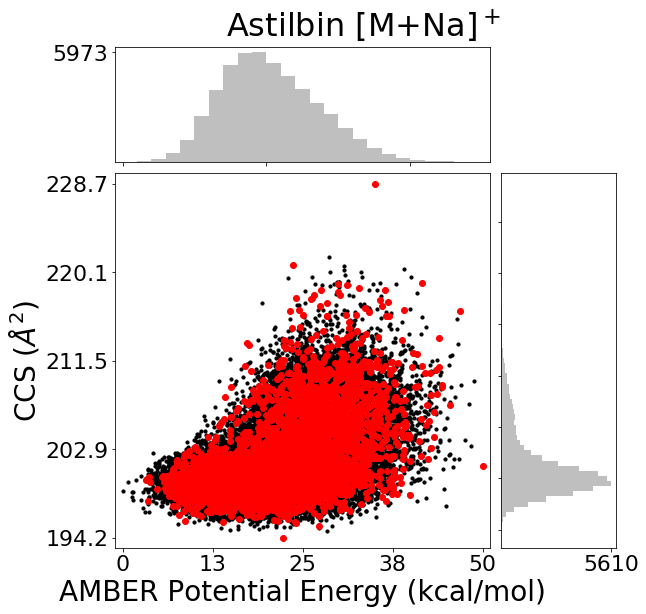

100


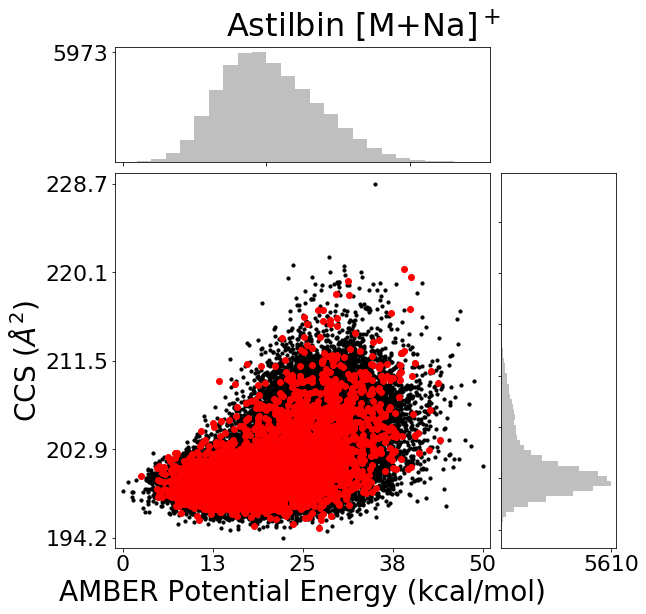

200


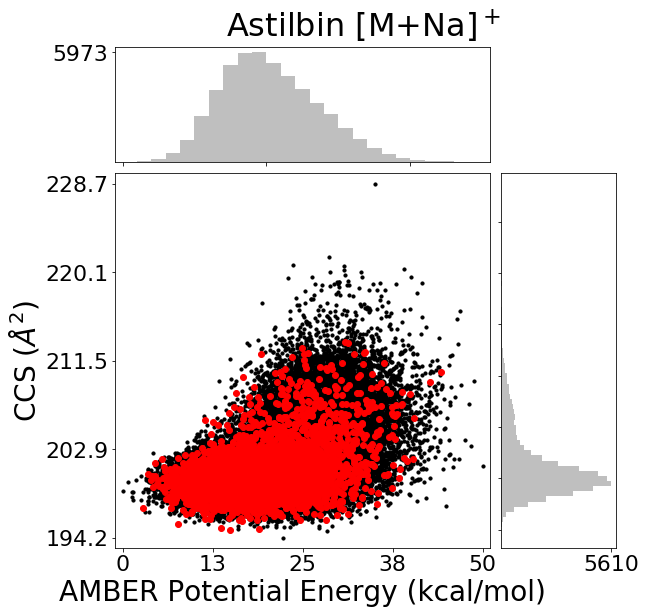

300


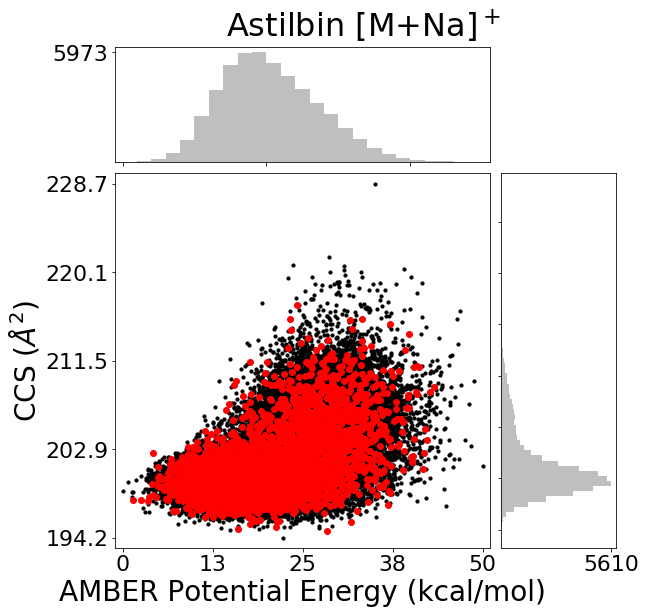

400


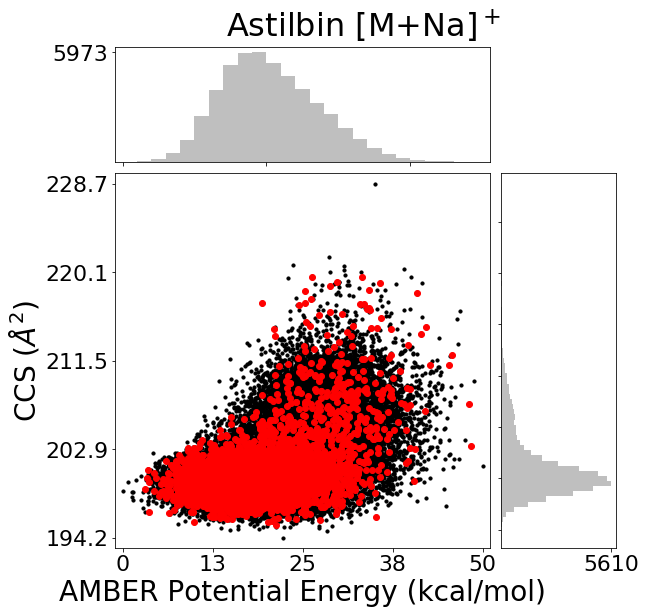

500


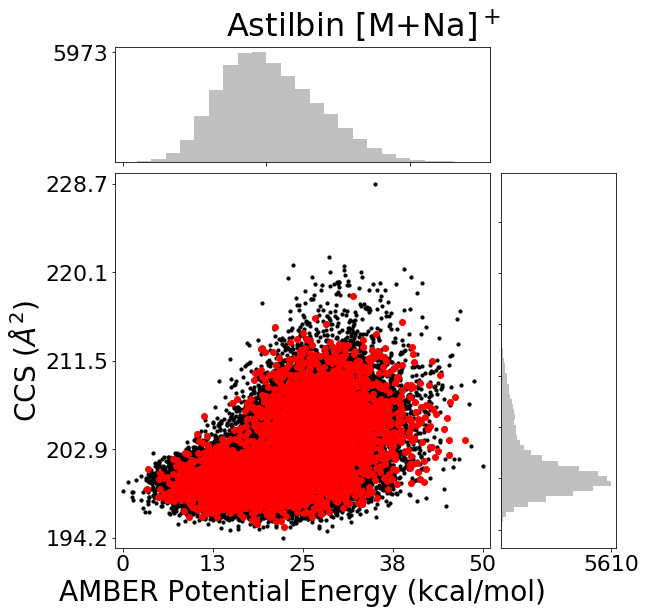

600


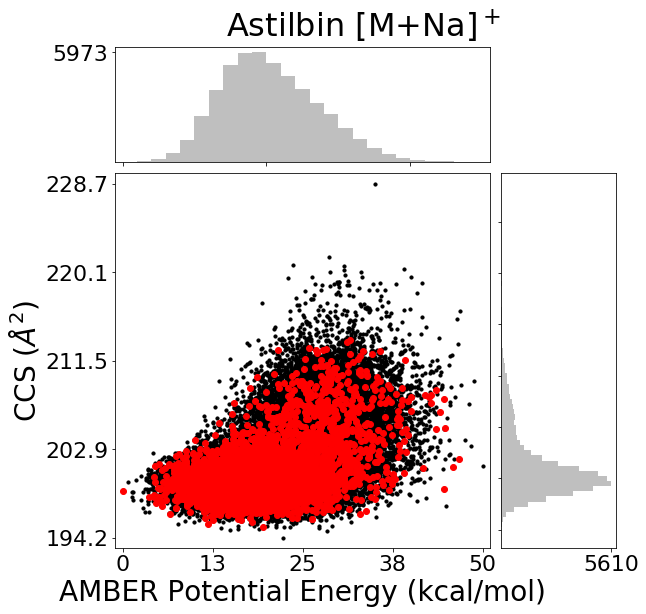

700


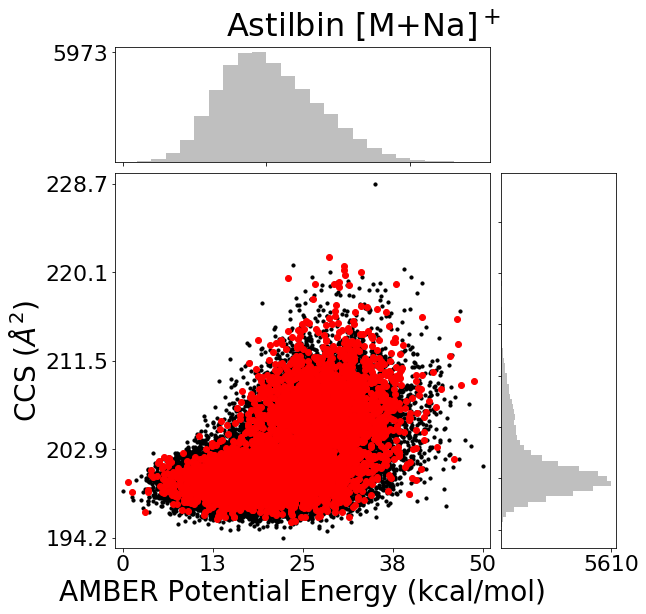

800


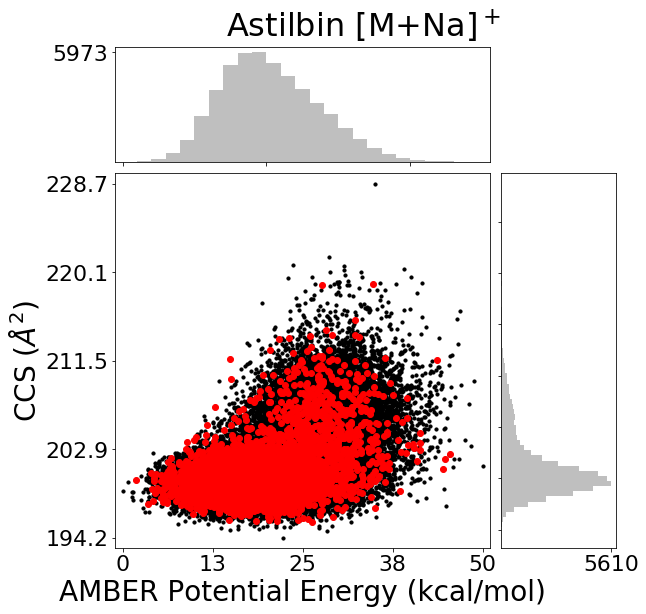

900


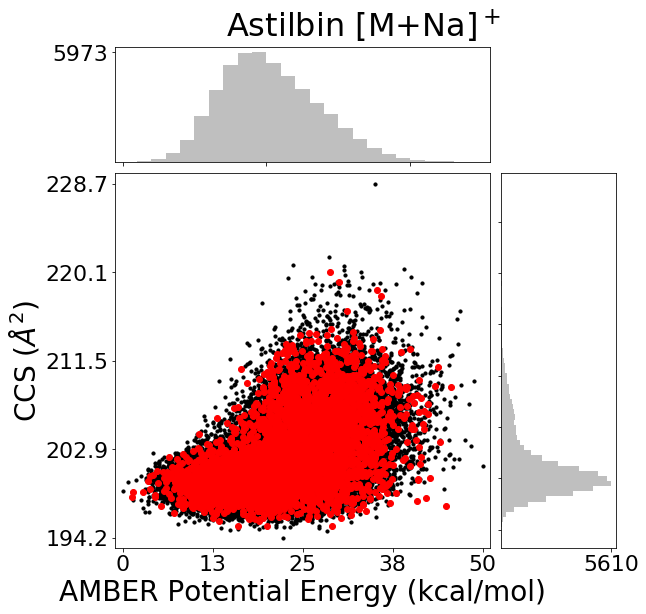

1000


IndexError: index 11 is out of bounds for axis 0 with size 11

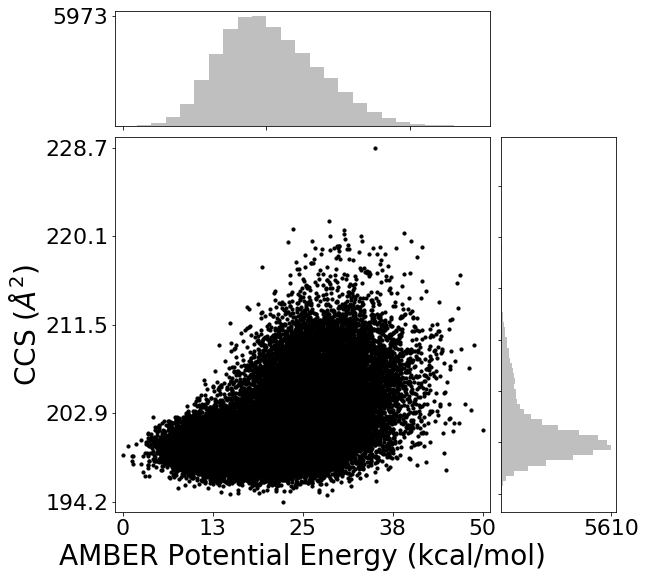

In [45]:
# There doesn't seem to be a cycle dependency on the range of energies captured by AMBER, despite what the above was 
# making me believe

cycles = np.arange(0, 1100, 100)
for c, cycle in enumerate(cycles):
    
    # Plot CCS v DFT energy
    d=9
    # look at 4, 8, 9, 10, 11 <-- fo sure this one
    
    for ID in molids[d:d+1]:  
        file = f'../data/molid{ID}{adducts[d]}_amber_dft_ccs.csv'

        if os.path.exists(file):
            pass
        else:
            continue

        df = pd.read_csv(file)

        # Set the minimum energy to 0 and scale the rest accordingly.
        # Comment these out to restore specific AMBER energy values
        # Which are apparently mostly arbitrary, you can't compare them across molecules
        mn = df['EPtot'].min()
        df['EPtot'] = df['EPtot'] - mn

        x = df['EPtot']
        y = df['ccs']

        nullfmt = NullFormatter()

        # Define the axes
        left, width = 0.1, 0.65
        bottom, height = 0.1, 0.65
        bottom_h = left_h = left + width + 0.02

        rect_scatter = [left, bottom, width, height]
        rect_histx = [left, bottom_h, width, 0.2]
        rect_histy = [left_h, bottom, 0.2, height]


        plt.figure(1, figsize=(8, 8))

        axScatter = plt.axes(rect_scatter)
        axHistx = plt.axes(rect_histx)
        axHisty = plt.axes(rect_histy)

        # no labels
        axHistx.xaxis.set_major_formatter(nullfmt)
        axHisty.yaxis.set_major_formatter(nullfmt)

        # Generate color by density
    #    xy = np.vstack([x,y])
    #    z = gaussian_kde(xy)(xy)
        z = 'black'
        # the scatter plot:
        axScatter.scatter(x, y, c=z, s=10)

        binwidth = 0.25

        #axScatter.set_xlim((np.min(x)-0.0015,np.max(x)+0.0015))
        axScatter.set_xlim((np.min(x)-1,np.max(x)+1))
        axScatter.set_ylim((np.min(y)-1,np.max(y)+1))
        axScatter.set_ylabel('CCS ($\AA^2$)', fontsize=28)
        axScatter.set_xlabel('AMBER Potential Energy (kcal/mol)', fontsize=28)

        binwidthx = 2
        binwidthy = 0.5
        binx = np.arange(np.min(x), np.max(x), binwidthx)
        biny = np.arange(np.min(y), np.max(y), binwidthy)
        hxy, hxx, _ = axHistx.hist(x, bins=binx, color='#bfbfbf')
        hyy, hyx, _ = axHisty.hist(y, bins=biny, orientation='horizontal', color='#bfbfbf')

        axHistx.set_xlim(axScatter.get_xlim())
        axHisty.set_ylim(axScatter.get_ylim())
        #axHistx.set_xticklabels(x_ticks, rotation=0, fontsize=12)
        #axHisty.set_yticklabels(y_ticks, rotation=0, fontsize=2)


        # Adjust tick sizes and fonts
        axHistx.tick_params(axis='both', which='major', labelsize=22)
        axHisty.tick_params(axis='both', which='major', labelsize=22)
        axScatter.tick_params(axis='both', which='major', labelsize=22)

        axScatter.xaxis.set_major_formatter(FormatStrFormatter('%0.0f'))
        axScatter.yaxis.set_major_formatter(FormatStrFormatter('%0.1f'))


        #xtic = np.linspace(np.min(x)-0.01, np.max(x)+0.01, 3) # For using real DFT values
        xtic = np.linspace(np.min(x), np.max(x), 5)
        ytic = np.linspace(np.min(y), np.max(y), 5)
        axScatter.set_xticks(xtic)
        axScatter.set_yticks(ytic)

        axHistx.set_yticks([hxy.max()])
        axHisty.set_xticks([hyy.max()])

        # Plot cycles as colored (check for clustering)
        #cycle = 10
        print(cycle)
        index = df.loc[(df['cycle'] > cycles[c]) & (df['cycle'] < cycles[c+1])].index
        axScatter.scatter(x[index], y[index], c='red')
        
#         index = df.loc[df['cycle'] == cycle+1].index
#         axScatter.scatter(x[index], y[index], c='blue')
        
#         index = df.loc[df['cycle'] == cycle+2].index
#         axScatter.scatter(x[index], y[index], c='green')      
        
#         index = df.loc[df['cycle'] == cycle+3].index
#         axScatter.scatter(x[index], y[index], c='yellow')         

        plt.title(f'{names[d]} [M{adducts[d]}]$^{adducts[d][0]}$', fontsize=32, y=1.35, x=-1.2)
        plt.show()

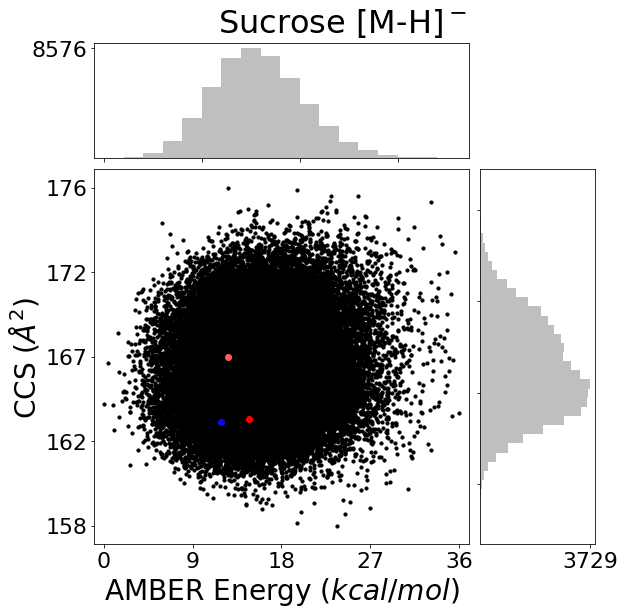

In [4]:
# Used to make AMBER version of main paper figure

# Plot CCS v DFT energy
start = 15 #5 #15 #17
stop = 16 #6 #16 #18
for d, ID in enumerate(molids[start:stop], start=start):

    file = f'../data/molid{ID}{adducts[d]}_amber_dft_ccs.csv'
    file2 = f'../data/molid{ID}{adducts[d]}_amber_dft_ccs_filled50k.csv'
    
    if os.path.exists(file):
        pass
    else:
        continue
        
    df = pd.read_csv(file)
    df2 = pd.read_csv(file2)
    
    # Set the minimum energy to 0 and scale the rest accordingly.
    # Comment these out to restore specific DFT energy values
    # Which are apparently mostly arbitrary, you can't compare them across molecules
    mn = df['EPtot'].min()
    df['EPtot'] -= mn
    
    df2['EPtot'] -= mn    
    
    x = df['EPtot']
    y = df['ccs']

    x2 = df2['EPtot']
    y2 = df2['ccs']    
    
    nullfmt = NullFormatter()

    # Define the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02

    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]


    plt.figure(1, figsize=(8, 8))

    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)

    # no labels
    axHistx.xaxis.set_major_formatter(nullfmt)
    axHisty.yaxis.set_major_formatter(nullfmt)

    # Generate color by density
    #xy = np.vstack([x,y])
    #z = gaussian_kde(xy)(xy)
    z = 'black'
    # the scatter plot:
    axScatter.scatter(x, y, c=z, s=10)

    binwidth = 0.25

    axScatter.set_xlim((np.min(x)-1,np.max(x)+1))
    axScatter.set_ylim((np.min(y)-1,np.max(y)+1))
    axScatter.set_ylabel('CCS ($\AA^2$)', fontsize=28)
    axScatter.set_xlabel('AMBER Energy $\it{(kcal/mol)}$', fontsize=28)

    binwidthx = 2
    binwidthy = 0.5
    binx = np.arange(np.min(x), np.max(x), binwidthx)
    biny = np.arange(np.min(y), np.max(y), binwidthy)
    hxy, hxx, _ = axHistx.hist(x, bins=binx, color='#bfbfbf')
    hyy, hyx, _ = axHisty.hist(y, bins=biny, orientation='horizontal', color='#bfbfbf')

    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())

    # Adjust tick sizes and fonts
    axHistx.tick_params(axis='both', which='major', labelsize=22)
    axHisty.tick_params(axis='both', which='major', labelsize=22)
    axScatter.tick_params(axis='both', which='major', labelsize=22)

    axScatter.xaxis.set_major_formatter(FormatStrFormatter('%0.0f'))
    axScatter.yaxis.set_major_formatter(FormatStrFormatter('%0.0f'))

    xtic = np.linspace(np.min(x), np.max(x), 5)
    ytic = np.linspace(np.min(y), np.max(y), 5)
    axScatter.set_xticks(xtic)
    axScatter.set_yticks(ytic)

    axHistx.set_yticks([hxy.max()])
    axHisty.set_xticks([hyy.max()])

    # Plot the 1 most similar, 2 most dissimilar in red
     # Use ~/Documents/excel-and-data/nDisSimmSim/NDisConf_all_simple_average/molid* to find the indexes
    axScatter.scatter(x2[3053], y2[3053], c='#1403fc') #blue, most similar
    axScatter.scatter(x2[20880], y2[20880], c='#fc0303') #red
    axScatter.scatter(x2[30391], y2[30391], c='#ff5c5c') #lighter red
    
    # KEY
    # blue, red, pink
    #20291,25675,41046 molid02
    #43825,9332,39791 molid11
    #3053,20880,30391 molid25
    #45221,21225,42604 molid29
    
    plt.title(f'{names[d]} [M{adducts[d]}]$^{adducts[d][0]}$', fontsize=32, y=1.35, x=-1.2)
    #plt.savefig(f'cloud-{names[d]}-1sim2dis-MD.png', dpi=900, bbox_inches='tight')
    #plt.savefig(f'cloud-PE-1sim2dis-MD.png', dpi=900, bbox_inches='tight')
    
    plt.show()
